In [1]:
import pyart
import numpy as np
from datetime import datetime, timedelta
import glob
# from radarcalc import *
import matplotlib.pyplot as plt
import pandas as pd
import metpy.calc as mpcalc
import metpy
import metpy.plots
from metpy.units import units
import cartopy.crs as ccrs
import gc
from astropy.convolution import convolve
from boto.s3.connection import S3Connection
import tempfile
import copy
import matplotlib


## You are using the Python ARM Radar Toolkit (Py-ART), an open source
## library for working with weather radar data. Py-ART is partly
## supported by the U.S. Department of Energy as part of the Atmospheric
## Radiation Measurement (ARM) Climate Research Facility, an Office of
## Science user facility.
##
## If you use this software to prepare a publication, please cite:
##
##     JJ Helmus and SM Collis, JORS 2016, doi: 10.5334/jors.119



In [2]:
def find_nearest(array, value):
    '''
    Function to find index of the array in which the value is closest to

    Parameters: array (array), value (number)
    Returns: index (int)

    Example: xind = CM1calc.find_nearest(x,5)
    '''

    array = np.asarray(array)
    idx = (np.abs(array-value)).argmin()
    return idx


def dealias_Ka(radar,PPIGC_flag=False):
    '''
    This function aims to take care of all the nitty gritty customizations of pyarts dealiasing specifically for TTUKa radar data.

    Parameter: radar (pyart object), PPIGC_flag (boolean *kwarg)
    Returns: radar (pyart object) with corrected_velocity field and velocity_texture field added on

    How it works:
    1. Calculates velocity texture and creates a histogram based on all of the magnitudes of textures at each bin for the entire volume
    2. loops through each indivual sweep
    3. infinite loop to iterate between the minimum amount of texture between textures 1 and 6 and the maximum amount of texture in the histogram, with 0.5 m/s steps
    4. Each iteration, create a gatefilter that filters the bins above that texture value and dealias it with the gatefilter to ignore the high textured regions
    5. If the maximum texture is reached before breaking, set the gatefilter to mask textures above 12 m/s
    6. if the scan is an RHI, run a 2 pass variance filter along each ray.
        This convolves a 71 sized boxcar with the data, and if the difference between the point the boxcar is centered on and the mean of the boxcar is greater than the nyquist, then add/subtract 2*nyquist to that point
    7. Then, take the difference between the mean of the bottom 4 rays of the dealiased velocity in the RHI and the bottom 4 rays of the aliased velocity
    8. If the absolute difference is larger than the nyquist, the either subtract 2* nyquist or add 2*nyquist to the entire sweep and break the loop
    9. If the absolute difference is less than the nyquist, no fixes need to be applied, break the loop
    10. If the scan is a PPI, do steps 8 and 9, but skip steps 6 and 7
    11. Outside the infinite loop, add the option of the PPIGC_flag, a boolean flag that will help maintain ground clutter in PPIs at 0 m/s
        This works by identifying regions of very low spectrum width (<0.1 m/s), and setting the velocity in those regions = 0. Please note, this may introduce artificial speckles of 0 in real data, where spectrum width is noisy
    12. Apply the alias fix algorithm which convolves a boxcar of specified boxcar of size 9 with the data, and if the variance between the middle pixel of interest and the mean is greater than the nyquist, then flip it back over
    12. At the end of each sweep, assign the data from that processed sweep into a dictionary, then add the dictionary as the corrected_velocity field.
    
    The aforementioned method is FAR from perfect, but is as robust as I can do currently. One thing to improve this though is to use the UNRAVEL algorithm: https://github.com/vlouf/dealias
    The UNRAVEL algorithm shows remarkable error characteristics compared to "competitors", possibly at a time cost, which isn't a HUGE deal for us. Downside is it may not work for our "volumes" since they are temporally uncorrelated and are not full volumes through the atmosphere
    '''
    
    vel_texture = pyart.retrieve.calculate_velocity_texture(radar, vel_field='velocity', wind_size=3)
    radar.add_field('velocity_texture', vel_texture, replace_existing=True)
    hist, bins = np.histogram(radar.fields['velocity_texture']['data'][~np.isnan(radar.fields['velocity_texture']['data'])], bins=150)
    bins = (bins[1:]+bins[:-1])/2.0
    gatefilter = pyart.filters.GateFilter(radar)
    velocity_dealiased = pyart.correct.dealias_region_based(radar, vel_field='velocity', nyquist_vel=radar.instrument_parameters['nyquist_velocity']['data'][0], centered=True) #standin, data will be replaced

    for swp_id in range(radar.nsweeps):
        #get indices from beginning and ending of sweep
        sw_start = radar.sweep_start_ray_index['data'][swp_id]
        sw_end = radar.sweep_end_ray_index['data'][swp_id]+1

        counter = 0
        while True: #do an infinite loop and either break it when the data is unfolded correctly or when the max texture is reached
            #if the bin with the lowest count between textures 1 and 6 + i*0.5 is less than the maximum amount of bins
            if bins[np.where(hist==np.min(hist[find_nearest(bins,1):find_nearest(bins,6)]))[0][0]]+counter*0.5 < np.amax(bins):
                gatefilter.exclude_above('velocity_texture', bins[np.where(hist==np.min(hist[find_nearest(bins,1):find_nearest(bins,6)]))[0][0]]+counter*0.5)
                nyq = radar.instrument_parameters['nyquist_velocity']['data'][0]
                vede = pyart.correct.dealias_region_based(radar, vel_field='velocity', nyquist_vel=nyq,
                                                                        centered=True, gatefilter=gatefilter)
            else:
                gatefilter.exclude_above('velocity_texture', 12)#bins[np.where(hist==np.min(hist[find_nearest(bins,1):find_nearest(bins,6)]))[0][0]])
                nyq = radar.instrument_parameters['nyquist_velocity']['data'][0]
                vede = pyart.correct.dealias_region_based(radar, vel_field='velocity', nyquist_vel=nyq,
                                                                        centered=True, gatefilter=gatefilter)


            np.ma.set_fill_value(vede['data'], np.nan)
            #extract mask so we can apply the correct gatefilters on later
            mask=np.ma.getmask(vede['data'])

            #apply mask to velocity field and fix the small blips from dealiasing
            if radar.scan_type == 'rhi':
                #pass 1 of variance filtering along the ray.
                #Convolves a 71 sized boxcar with the data, and if the difference between the point the boxcar is centered on and the mean of the boxcar is greater than the nyquist, then add/subtract 2*nyquist to that point
                vel = vede['data'].filled()

                for sw in range(np.shape(vel)[0]):
                    mean = convolve(vel[sw,:],np.ones(71))
                    var = vel[sw,:]-mean
                    high_idx = var > nyq
                    low_idx = var < -nyq
                    vel[sw,:][high_idx] = vel[sw,:][high_idx] - 2*nyq
                    vel[sw,:][low_idx] = vel[sw,:][low_idx] + 2*nyq
                vede['data']=np.ma.masked_array(vel,mask=mask,fill_value=np.nan)

                #pass 2 of variance filtering along the ray. In case there are errant folds than need to be folded back
                vel = vede['data'].filled()
                for sw in range(np.shape(vel)[0]):
                    mean = convolve(vel[sw,:],np.ones(71))
                    var = vel[sw,:]-mean
                    high_idx = var > nyq
                    low_idx = var < -nyq
                    vel[sw,:][high_idx] = vel[sw,:][high_idx] - 2*nyq
                    vel[sw,:][low_idx] = vel[sw,:][low_idx] + 2*nyq
                vede['data']=np.ma.masked_array(vel,mask=mask,fill_value=np.nan)

                #find means of the bottom 4 rays of the RHI(should be close to 0) and compare the dealiased velocities to the aliased velocities
                np.ma.set_fill_value(radar.fields['velocity']['data'], np.nan)
                meanvelal = np.mean(radar.fields['velocity']['data'][sw_start:sw_start+4,:].filled()[~np.isnan(radar.fields['velocity']['data'][sw_start:sw_start+4,:].filled())])
                meanveldeal = np.mean(vede['data'][sw_start:sw_start+4,:].filled()[~np.isnan(vede['data'][sw_start:sw_start+4,:].filled())])
                if np.abs(meanvelal-meanveldeal) < nyq: #nyq is an arbitrary threshold and should be tuned
                    break
                if bins[np.where(hist==np.min(hist[find_nearest(bins,1):find_nearest(bins,6)]))[0][0]]+counter*0.5 < np.amax(bins):
                    if (meanvelal-meanveldeal) > 0:
                        vede['data'][sw_start:sw_end,:] += 2*nyq
                    else:
                        vede['data'][sw_start:sw_end,:] -= 2*nyq
                    break
            if radar.scan_type == 'ppi':
                np.ma.set_fill_value(radar.fields['velocity']['data'], np.nan)
                meanvelal = np.mean(radar.fields['velocity']['data'][sw_start:sw_end,:].filled()[~np.isnan(radar.fields['velocity']['data'][sw_start:sw_end,:].filled())])
                meanveldeal = np.mean(vede['data'][sw_start:sw_end,:].filled()[~np.isnan(vede['data'][sw_start:sw_end,:].filled())])
                if np.abs(meanvelal-meanveldeal) < nyq: #nyq is an arbitrary threshold and should be tuned
                    break
                if bins[np.where(hist==np.min(hist[find_nearest(bins,1):find_nearest(bins,6)]))[0][0]]+counter*0.5 < np.amax(bins):
                    if (meanvelal-meanveldeal) > 0:
                        vede['data'][sw_start:sw_end,:] += 2*nyq
                    else:
                        vede['data'][sw_start:sw_end,:] -= 2*nyq
                    break
            counter+=1
            
        #put alias fix inside here instead of calling it to make it more portable
        delta=3
        mean = convolve(vede['data'][sw_start:sw_end,:],np.ones((delta,delta))/delta**2.)
        mean[0,:] = vede['data'][sw_start:sw_end,:][0,:]
        mean[-1,:] = vede['data'][sw_start:sw_end,:][-1,:]
        var = vede['data'][sw_start:sw_end,:] - mean

        high_idx = np.logical_and(var > nyq, var < 4*nyq)
        low_idx = np.logical_and(var < -nyq, var > -4*nyq)

        vede['data'][sw_start:sw_end,:][high_idx] = vede['data'][sw_start:sw_end,:][high_idx] - 2*nyq
        vede['data'][sw_start:sw_end,:][low_idx] = vede['data'][sw_start:sw_end,:][low_idx] + 2*nyq

        #corrects ground clutter by arbitrarily setting the velocity equal to 0 where spectrum width is less than 0.075 m/s
        if PPIGC_flag == True:
            if radar.scan_type == 'ppi':
                sw = radar.fields['spectrum_width']['data'][sw_start:sw_end,:].filled()
                vel = radar.fields['velocity']['data'][sw_start:sw_end,:].filled()
                mask = sw<0.1
                vede['data'][sw_start:sw_end,:] = np.where(~mask,vede['data'][sw_start:sw_end,:],0)

        velocity_dealiased['data'][sw_start:sw_end,:] = vede['data'][sw_start:sw_end,:]
        velocity_dealiased['data'][sw_start:sw_end,:] = alias_fix(velocity_dealiased['data'][sw_start:sw_end,:],nyq,delta=9)
    radar.add_field('corrected_velocity', velocity_dealiased, replace_existing=True)

    return radar

def alias_fix(vel,nyq,delta=3):
    '''
    !!!!!!!!!!!!!!!!!!
    Removes dealiasing errors around the periphery of a folded region

    Parameters: velocity array (array), nyquist velocity (number), size of window (int, must be odd, unity is no change)
    Returns: cleaned velocity array (array)
    '''
    mean = convolve(vel,np.ones((delta,delta))/delta**2.)
    mean[0,:] = vel[0,:]
    mean[-1,:] = vel[-1,:]
    var = vel - mean

    high_idx = np.logical_and(var > nyq, var < 4*nyq)
    low_idx = np.logical_and(var < -nyq, var > -4*nyq)

    vel[high_idx] = vel[high_idx] - 2*nyq
    vel[low_idx] = vel[low_idx] + 2*nyq

    return vel

def get_radar_from_aws_sam(site, datetime_t, datetime_te):
    """
    Get the closest volume of NEXRAD data to a particular datetime.
    Parameters
    ----------
    site : string
        four letter radar designation
    datetime_t : datetime
        desired date time
    Returns
    -------
    radar : Py-ART Radar Object
        Radar closest to the queried datetime
    """
    # SAM: added nexradaws to scan bucket instead of boto because boto was causing weird timeout errors...
    import nexradaws
    import os
    
    conn = nexradaws.NexradAwsInterface()

    scans = conn.get_avail_scans_in_range(datetime_t-timedelta(minutes=15), datetime_te+timedelta(minutes=15), site)

    scans = [scan for scan in scans if "_MDM" not in scan.filename]

    keys = [scan.filename for scan in scans]
    datetimes = [scan.scan_time.replace(tzinfo=None) for scan in scans]
    
    # This is alex's code again:
    # find the closest available radar to your datetime
    closest_datetime_b = _nearestDate(datetimes, datetime_t)
    closest_datetime_e = _nearestDate(datetimes, datetime_te)

    index_b = datetimes.index(closest_datetime_b)
    index_e = datetimes.index(closest_datetime_e)

    radar_namelist = keys[index_b:index_e+1]

    # SAM: slightly modified download routine
    remote_scan_list = scans[index_b:index_e+1]
    radar_list = []
    for remote_scan in remote_scan_list:
        conn.download(remote_scan, '.')
        rdr = pyart.io.read(remote_scan.filename)
        radar_list.append(rdr)
        os.remove(remote_scan.filename)
    return radar_namelist,radar_list

    



def get_radar_from_aws(site, datetime_t, datetime_te):
    """
    Get the closest volume of NEXRAD data to a particular datetime.
    Parameters
    ----------
    site : string
        four letter radar designation
    datetime_t : datetime
        desired date time
    Returns
    -------
    radar : Py-ART Radar Object
        Radar closest to the queried datetime
    """

    # First create the query string for the bucket knowing
    # how NOAA and AWS store the data
    my_pref = datetime_t.strftime('%Y/%m/%d/') + site

    # Connect to the bucket
    conn = S3Connection(anon = True)
    bucket = conn.get_bucket('noaa-nexrad-level2')

    # Get a list of files
    bucket_list = list(bucket.list(prefix = my_pref))

    # we are going to create a list of keys and datetimes to allow easy searching
    keys = []
    datetimes = []

    # populate the list
    for i in range(len(bucket_list)):
        this_str = str(bucket_list[i].key)
        if 'gz' in this_str:
            endme = this_str[-22:-4]
            fmt = '%Y%m%d_%H%M%S_V0'
            dt = datetime.strptime(endme, fmt)
            datetimes.append(dt)
            keys.append(bucket_list[i])

        if this_str[-3::] == 'V06':
            endme = this_str[-19::]
            fmt = '%Y%m%d_%H%M%S_V06'
            dt = datetime.strptime(endme, fmt)
            datetimes.append(dt)
            keys.append(bucket_list[i])

    
    # find the closest available radar to your datetime
    closest_datetime_b = _nearestDate(datetimes, datetime_t)
    closest_datetime_e = _nearestDate(datetimes, datetime_te)

    index_b = datetimes.index(closest_datetime_b)
    index_e = datetimes.index(closest_datetime_e)

    radar_namelist = keys[index_b:index_e+1]
    radar_list=[]
    for i in range(np.shape(radar_namelist)[0]):
        localfile = tempfile.NamedTemporaryFile()
        radar_namelist[i].get_contents_to_filename(localfile.name)
        radar_list.append(pyart.io.read(localfile.name))
    return radar_namelist,radar_list

def getLocation(lat1, lon1, brng, distancekm):
    lat1 = lat1 * np.pi / 180.0
    lon1 = lon1 * np.pi / 180.0
    #earth radius
    R = 6378.1
    #R = ~ 3959 MilesR = 3959
    bearing = (brng / 90.)* np.pi / 2.

    lat2 = np.arcsin(np.sin(lat1) * np.cos(distancekm/R) + np.cos(lat1) * np.sin(distancekm/R) * np.cos(bearing))
    lon2 = lon1 + np.arctan2(np.sin(bearing)*np.sin(distancekm/R)*np.cos(lat1),np.cos(distancekm/R)-np.sin(lat1)*np.sin(lat2))
    lon2 = 180.0 * lon2 / np.pi
    lat2 = 180.0 * lat2 / np.pi
    return lat2, lon2

def _nearestDate(dates, pivot):
    return min(dates, key=lambda x: abs(x - pivot))

def find_nearest(array, value):
    '''
    Function to find index of the array in which the value is closest to

    Parameters: array (array), value (number)
    Returns: index (int)

    Example: xind = CM1calc.find_nearest(x,5)
    '''

    array = np.asarray(array)
    idx = (np.abs(array-value)).argmin()
    return idx


def vehicle_correction_vad(radar,df):
    '''
    Function that creates a 'vad_corrected_velocity' field that can be used for vad calculations, 
    but should be general enough to use for stationary VADs as well as moving PPIs. 
    Other than adding the new field, the radar times are smoothly interpolated and the azimuths are 
    corrected via the GPS pandas dataframe.
    
    Parameters: pyart radar object (object), pandas dataframe of appropriate radarGPS file (dataframe)
    Returns: pyart radar object (object), speed (float), speed variance (float), bearing (float), bearing variance (float), 
             latitude (float), latitude variance (float), longitude (float), longitude variance (float)
    
    Example: radar, velmean, velvar, bearmean, bearvar, latmean, latvar, lonmean, lonvar = vehicle_correction_vad(radar,df)

    p.s. only works if the velocity is already dealiased and there is a 'corrected_velocity' field
         also only works if a single sweep is extracted, example: radar = radar.extract_sweeps([0])
    '''
    
    #orders the time to increase monotonically instead of having a massive step jump in the middle
    roll_mag = (np.argmax(np.abs(np.gradient(radar.time['data'])))+1)
    times = np.roll(radar.time['data'],-roll_mag) 
    
    #a complicated way to create linear increasing times (instead of steps) that start at 0 seconds after the time datum and increase to the middle of the second max time plateau (if confused, plotting it is helpful)
    #from now on, we are going to assume ray_times is the fractional seconds after the time datum the ray is gathered, and we need to roll it back to match with the rest of the data
    ray_times = np.roll(np.arange(0,((np.unique(times)[-2])/(find_nearest(times,np.unique(times)[-2])+int(np.sum(radar.time['data']==np.unique(times)[-2])/2)))*len(times)+1e-11,((np.unique(times)[-2])/(find_nearest(times,np.unique(times)[-2])+int(np.sum(radar.time['data']==np.unique(times)[-2])/2)))),roll_mag)

    radar.time['data']=ray_times


    df['datetime'] = [datetime.strptime(d,'%d%m%y%H%M%S') for d in df['ddmmyy']+[f'{h:06}' for h in df['hhmmss[UTC]'].astype(int)]]
    beginscanindex = df.loc[df['datetime'] == datetime.strptime(radar.time['units'],'seconds since %Y-%m-%dT%H:%M:%SZ')].index
    endscanindex = df.loc[df['datetime'] == datetime.strptime(radar.time['units'],'seconds since %Y-%m-%dT%H:%M:%SZ')].index+np.ceil(np.amax(ray_times))+1
    

    #else:
    
    dfscan = df.iloc[beginscanindex[0].astype(int):endscanindex[0].astype(int)]
    dfscan = dfscan.astype({'Bearing[degrees]': 'float'})
    dfscan = dfscan.astype({'Velocity[knots]': 'float'})
    
    ray_bearings = np.interp(ray_times,np.arange(len(dfscan)),dfscan['Bearing[degrees]'])
    ray_speeds = np.interp(ray_times,np.arange(len(dfscan)),dfscan['Velocity[knots]'])
    
    print('velocity [kts]',dfscan['Velocity[knots]'].mean(),'+-',dfscan['Velocity[knots]'].var())
    speed = dfscan['Velocity[knots]'].mean()
    print('bearing',dfscan['Bearing[degrees]'].mean(),'+-',dfscan['Bearing[degrees]'].var())
    bearing = dfscan['Bearing[degrees]'].mean()
    print('latitude',dfscan['Latitude'].astype(float).mean(),'+-',dfscan['Latitude'].astype(float).var())
    lat = dfscan['Latitude'].astype(float).mean()
    print('longitude',dfscan['Longitude'].astype(float).mean(),'+-',dfscan['Longitude'].astype(float).var())
    lon = dfscan['Longitude'].astype(float).mean()
    
    radar.azimuth['data'] += ray_bearings[:-1] #bearing
    
    rad_vel = copy.deepcopy(radar.fields['corrected_velocity'])
    
    rad_vel['data']+=(np.cos(np.deg2rad(radar.azimuth['data']-ray_bearings[:-1]))*(ray_speeds[:-1]/1.94384)*np.cos(np.deg2rad(radar.fixed_angle['data'][0])))[:,np.newaxis]
    
     #fix mask, remove points very close to radar as well as the very last bin, more often than not, = bad data
    rad_vel['data'].mask[:,:5] = True
    rad_vel['data'].mask[:,-1] = True
    radar.add_field('vad_corrected_velocity', rad_vel, replace_existing=True)
    
    return radar, dfscan['Velocity[knots]'].mean(),dfscan['Velocity[knots]'].var(),dfscan['Bearing[degrees]'].mean(),dfscan['Bearing[degrees]'].var(),dfscan['Latitude'].astype(float).mean(),dfscan['Latitude'].astype(float).var(),dfscan['Longitude'].astype(float).mean(),dfscan['Longitude'].astype(float).var()

In [3]:
ka1_vads_df = pd.read_csv('/Users/juliabman/Desktop/research2024/vad_dfs/ka1_vads_df')
ka2_vads_df = pd.read_csv('/Users/juliabman/Desktop/research2024/vad_dfs/ka2_vads_df')

In [4]:
ka1_vads_df

,Unnamed: 0.2,Unnamed: 0.1,Unnamed: 0,index,Datetime,Scantype,Angles,Ranges,Radar,Velmean,Velvar,Bearmean,Latmean,Latvar,Lonmean,Lonvar,tobac_time,tobac_time_indeces,tobac_lats,tobac_lons
0,0,0,0,0,2022-05-23 20:18:19,vad,[37. 45.],9972.0,<pyart.core.radar.Radar object at 0x2a67eb8b0>,41.322128,13.541626,270.857660,33.593844,1.493618e-09,-102.341872,9.543316e-06,2022-05-23 22:21:17,0,33.725464,-103.115808
1,1,1,1,1,2022-05-23 20:18:49,vad,[37. 45.],9972.0,<pyart.core.radar.Radar object at 0x2a688d760>,42.164255,1.027729,270.870426,33.593926,1.237346e-09,-102.348762,1.018093e-05,2022-05-23 22:21:17,0,33.725464,-103.115808
2,2,2,2,2,2022-05-23 20:19:19,vad,[37. 45.],9972.0,<pyart.core.radar.Radar object at 0x2a67ca490>,39.817556,15.065437,270.855778,33.594000,1.142237e-09,-102.355451,8.773930e-06,2022-05-23 22:21:17,0,33.725464,-103.115808
3,3,3,3,3,2022-05-23 20:19:48,vad,[37. 45.],9972.0,<pyart.core.radar.Radar object at 0x2a688df40>,2.022109,46.544900,298.949818,33.594931,5.005760e-08,-102.361993,4.267158e-07,2022-05-23 22:21:17,0,33.725464,-103.115808
4,4,4,4,4,2022-05-23 20:20:19,vad,[37. 45.],9972.0,<pyart.core.radar.Radar object at 0x2a680f6d0>,6.971087,18.566854,232.127826,33.594825,3.518888e-08,-102.361671,1.986989e-07,2022-05-23 22:21:17,0,33.725464,-103.115808
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
150,150,150,150,190,2022-05-24 00:01:10,vad,[37. 45.],9972.0,<pyart.core.radar.Radar object at 0x2a4cf21c0>,3.976230,137.229424,248.844976,33.793174,1.025092e-05,-102.644966,1.008538e-06,2022-05-24 00:03:14,18,33.900867,-102.732445
151,151,151,151,191,2022-05-24 00:01:39,vad,[37. 45.],9972.0,<pyart.core.radar.Radar object at 0x2aa83fac0>,43.196667,15.037367,38.183750,33.784412,8.276087e-06,-102.642297,2.191911e-09,2022-05-24 00:03:14,18,33.900867,-102.732445
152,152,152,152,192,2022-05-24 00:02:09,vad,[37. 45.],9972.0,<pyart.core.radar.Radar object at 0x2a67eb760>,30.318413,305.878072,94.438095,33.791226,7.861599e-06,-102.642176,2.957845e-09,2022-05-24 00:03:14,18,33.900867,-102.732445
153,153,153,153,193,2022-05-24 00:02:39,vad,[37. 45.],9972.0,<pyart.core.radar.Radar object at 0x2a74057f0>,15.259574,295.846113,167.150213,33.793709,3.987920e-07,-102.642206,1.600216e-08,2022-05-24 00:03:14,18,33.900867,-102.732445


In [70]:
ka2_vads_df

,Unnamed: 0.2,Unnamed: 0.1,Unnamed: 0,index,Datetime,Scantype,Angles,Ranges,Radar,Velmean,Velvar,Bearmean,Latvar,Latmean,Lonvar,Lonmean,tobac_time,tobac_time_indeces,tobac_lats,tobac_lons
0,0,0,0,8,2022-05-23 22:07:37,vad,[37. 45.],9972.0,<pyart.core.radar.Radar object at 0x2ae1d78e0>,1.347536,14.111219,5.895362,1.871643e+03,33.873137,4.408650e-09,-102.760347,2022-05-23 22:21:17,0,33.725464,-103.115808
1,1,1,1,9,2022-05-23 22:08:09,vad,[37. 45.],9972.0,<pyart.core.radar.Radar object at 0x2a680f640>,0.000000,0.000000,0.350000,0.000000e+00,33.873155,0.000000e+00,-102.760346,2022-05-23 22:21:17,0,33.725464,-103.115808
2,2,2,2,10,2022-05-23 22:08:39,vad,[37. 45.],9972.0,<pyart.core.radar.Radar object at 0x2b4a7fb20>,0.001304,0.000056,0.350000,0.000000e+00,33.873153,5.418357e-12,-102.760347,2022-05-23 22:21:17,0,33.725464,-103.115808
3,3,3,3,11,2022-05-23 22:09:10,vad,[37. 45.],9972.0,<pyart.core.radar.Radar object at 0x2ae1d7310>,0.001621,0.000257,0.350000,3.093716e-33,33.873144,6.773982e-12,-102.760346,2022-05-23 22:21:17,0,33.725464,-103.115808
4,4,4,4,12,2022-05-23 22:09:41,vad,[37. 45.],9972.0,<pyart.core.radar.Radar object at 0x2b4a7f5e0>,0.000217,0.000002,0.350000,0.000000e+00,33.873146,1.675845e-12,-102.760347,2022-05-23 22:21:17,0,33.725464,-103.115808
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
133,133,133,133,221,2022-05-24 01:58:59,vad,[37. 45.],9972.0,<pyart.core.radar.Radar object at 0x2d2c4ff40>,0.000000,0.000000,99.980000,1.853173e-27,33.587712,0.000000e+00,-102.210940,2022-05-24 02:01:39,37,33.708539,-102.415292
134,134,134,134,222,2022-05-24 01:59:30,vad,[37. 45.],9972.0,<pyart.core.radar.Radar object at 0x2d2bb05e0>,0.000000,0.000000,99.980000,8.265795e-28,33.587712,0.000000e+00,-102.210942,2022-05-24 02:01:39,37,33.708539,-102.415292
135,135,135,135,223,2022-05-24 02:00:03,vad,[37. 45.],9972.0,<pyart.core.radar.Radar object at 0x2d2d8d2e0>,0.000000,0.000000,99.980000,0.000000e+00,33.587713,1.235278e-13,-102.210953,2022-05-24 02:01:39,37,33.708539,-102.415292
136,136,136,136,224,2022-05-24 02:00:33,vad,[37. 45.],9972.0,<pyart.core.radar.Radar object at 0x2d2d8de50>,0.000000,0.000000,99.980000,2.043243e-28,33.587713,3.406293e-14,-102.210950,2022-05-24 02:01:39,37,33.708539,-102.415292


In [5]:
ka1_vad_files = sorted(glob.glob('/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_*.nc'))

In [ ]:
radar_objects_ka1_test = []
for file in ka1_vad_files:
    radar = pyart.io.read(file)
    radar_objects_ka1_test.append(radar)

In [ ]:
radar_objects_ka1_test[0].scan_type

In [ ]:
radar = radar_objects_ka1_test[10]

In [ ]:
VAD = pyart.retrieve.vad_browning(radar,'corrected_velocity_terminal_clean') #z_want=np.arange(50,5001,10),gatefilter=None)
#VAD = radar.fields['corrected_velocity_terminal']['data']
vadu = VAD.u_wind*1.94384
vadv = VAD.v_wind*1.94384

fig = plt.figure(figsize=(30, 10),facecolor='white')
display = pyart.graph.RadarDisplay(radar)

ax1 = plt.subplot2grid((1,3),(0,0))
display.plot_ppi('corrected_velocity_terminal_clean', 0, cmap='pyart_balance', ax=ax1, vmin=-40., vmax=40.,
                     colorbar_label=r'Radial Velocity [m s$^{-1}$]') #title='Motion Corrected Radial Velocity')

ax3 = plt.subplot2grid((1,3),(0,2))

hodo = metpy.plots.Hodograph(ax3,component_range=80.)
hodo.add_grid(increment=5)

hodo.plot(vadu,vadv)
ax3.set_xlabel('U-component Wind [knots]')
ax3.set_ylabel('V-component Wind [knots]')
ax3.set_title('Vehicle motion corrected VAD')

In [ ]:
SMALL_SIZE = 30
MEDIUM_SIZE = 40
BIGGER_SIZE = 60

plt.rc('font', size=SMALL_SIZE)          # controls default text sizes
plt.rc('axes', titlesize=MEDIUM_SIZE)     # fontsize of the axes title
plt.rc('axes', labelsize=MEDIUM_SIZE)    # fontsize of the x and y labels
plt.rc('xtick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('ytick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('legend', fontsize=SMALL_SIZE)    # legend fontsize
plt.rc('figure', titlesize=BIGGER_SIZE)  # fontsize of the figure title

#vad_files = ka1_vad_files

#119 east
#170 south
#186 west
#191 north
for thefile in ka1_vad_files[120:125]:
    print(thefile)
    radar = pyart.io.read(thefile)
    if np.logical_and(radar.scan_type == 'ppi', radar.fixed_angle['data'][0] > 10):
        
        radar = radar.extract_sweeps([0])
        #radar = dealias_Ka(radar)
        
        df = pd.read_csv('/Users/juliabman/Desktop/research2024/GPS_Ka1_20220523.txt', dtype=str)
        
        radar, velmean, velvar, bearmean, bearvar, latmean, latvar, lonmean, lonvar = vehicle_correction_vad(radar,df)
        radar = pyart.io.read(thefile)

        try:
            VAD = pyart.retrieve.vad_browning(radar, 'vad_corrected_velocity', z_want=np.arange(50,5001,10),gatefilter=None)
        except:
            print('not enough data')
            continue
        vadu = VAD.u_wind*1.94384 # meters to knots
        vadv = VAD.v_wind*1.94384
        print(f'u velocity {vadu[:10]}')
        print(f'v velocity {vadv[:10]}')
        
        fig = plt.figure(figsize=(51, 17),facecolor='white')
        display = pyart.graph.RadarDisplay(radar)
        
        ax1 = plt.subplot2grid((1,3),(0,0))
        display.plot_ppi('vad_corrected_velocity', 0, cmap='pyart_balance', ax=ax1, vmin=-40., vmax=40.,
                             colorbar_label=r'Radial Velocity [m s$^{-1}$]') #title='Motion Corrected Radial Velocity')
        
        ax3 = plt.subplot2grid((1,3),(0,2))
        
        hodo = metpy.plots.Hodograph(ax3,component_range=40.)
        hodo.add_grid(increment=5)
        
        hodo.plot(vadu,vadv)
        ax3.set_xlabel('U-component Wind [knots]')
        ax3.set_ylabel('V-component Wind [knots]')
        ax3.set_title('Vehicle motion corrected VAD')
        
        for i,z in enumerate([0,95,195,295,395,495]):
            try:
                if np.isnan(vadu[z]):
                    pass
                else:
                    circle = plt.Circle((vadu[z], vadv[z]), radius=1.5,color='k',zorder=30)
                    ax3.add_patch(circle)
                    label = ax3.annotate(i, xy=(vadu[z], vadv[z]), fontsize=12, ha="center",va='center',color='white',zorder=30,weight="bold")
            except: pass
        
        
        r=35
        radar_namelist, radar_list = get_radar_from_aws_sam('KLBB', datetime.strptime(thefile.split('/')[-1].split('.')[0][29:],'%Y%m%d%H%M%S'), datetime.strptime(thefile.split('/')[-1].split('.')[0][29:],'%Y%m%d%H%M%S')+timedelta(minutes=5))
        print(radar_namelist)
        print(radar_list)
        #scantime88d = datetime.strptime(str(radar_namelist)[40:57], '%Y%m%d_%H%M%S') #SAM DELETED THAT
        swp_id = 0
        radar88d = radar_list[0].extract_sweeps([0])
        scantime88d = pyart.util.datetime_from_radar(radar88d)
        # SAM ADDED THAT^^^
        time_text = ' ' + str(radar88d.time['units'][-9:1])
        title ='KLBB PPI ' +scantime88d.strftime("%m/%d/%y %H:%M")+ ' UTC'
        display = pyart.graph.RadarMapDisplay(radar88d)
        ax2 = plt.subplot2grid((1,3),(0,1),projection=display.grid_projection)
        display.plot_ppi_map('reflectivity', swp_id, cmap='pyart_HomeyerRainbow', ax=ax2, vmin=0., vmax=75., 
                             colorbar_label='Radar Reflectivity [dBZ]', title='Reflectivity',
                             min_lon=getLocation(latmean, lonmean, 270, r)[1],
                             max_lon=getLocation(latmean, lonmean, 90, r)[1],
                             min_lat=getLocation(latmean, lonmean, 180, r)[0],
                             max_lat=getLocation(latmean, lonmean, 0, r)[0])
        
        m = matplotlib.markers.MarkerStyle(marker='^')
        m._transform = m.get_transform().rotate_deg(-bearmean)
        ax2.plot(lonmean,latmean,color='k',marker=m,ms=20,transform=ccrs.PlateCarree())
        m = matplotlib.markers.MarkerStyle(marker=3)
        m._transform = m.get_transform().rotate_deg(-bearmean)
        ax2.plot(lonmean,latmean,color='k',marker=m,ms=50,transform=ccrs.PlateCarree(),markeredgewidth=4)


        fname=thefile.split('/')[-1].split('.')[0][3:]
        plt.suptitle(fname)#+' '+str(np.around(dfscan['Bearing[degrees]'].astype(float).var(),decimals=2))+' '+str(np.around(dfscan['Velocity[knots]'].astype(float).var(),decimals=2)))
        plt.tight_layout()
        # plt.savefig(f"/Users/juliabman/Desktop/alex_morton_hodos/{fname}.png")
        # plt.close()
        # fig.clf()
        # gc.collect()
        plt.show()

In [6]:
SMALL_SIZE = 30
MEDIUM_SIZE = 40
BIGGER_SIZE = 60

plt.rc('font', size=SMALL_SIZE)          # controls default text sizes
plt.rc('axes', titlesize=MEDIUM_SIZE)     # fontsize of the axes title
plt.rc('axes', labelsize=MEDIUM_SIZE)    # fontsize of the x and y labels
plt.rc('xtick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('ytick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('legend', fontsize=SMALL_SIZE)    # legend fontsize
plt.rc('figure', titlesize=BIGGER_SIZE)  # fontsize of the figure title

#vad_files = test
vadu_list = []
vadv_list = []

#119 east
#170 south
#186 west
#191 north
for thefile in ka1_vad_files:
    print(thefile)
    radar = pyart.io.read(thefile)
    if np.logical_and(radar.scan_type == 'ppi', radar.fixed_angle['data'][0] > 10):
        
        radar = radar.extract_sweeps([0])
        #radar = dealias_Ka(radar)
        
        df = pd.read_csv('/Users/juliabman/Desktop/research2024/GPS_Ka1_20220523.txt', dtype=str)
        
        #radar, velmean, velvar, bearmean, bearvar, latmean, latvar, lonmean, lonvar = vehicle_correction_vad(radar,df)
        radar = pyart.io.read(thefile)

        try:
            VAD = pyart.retrieve.vad_browning(radar, 'corrected_velocity_terminal', z_want=np.arange(50,5001,10),gatefilter=None)
        except:
            print('not enough data')
            continue
        vadu = VAD.u_wind*1.94384 # meters to knots
        vadv = VAD.v_wind*1.94384
        print(f'u velocity {vadu[:10]}')
        print(f'v velocity {vadv[:10]}')
        
        # fig = plt.figure(figsize=(51, 17),facecolor='white')
        # display = pyart.graph.RadarDisplay(radar)
        
        # ax1 = plt.subplot2grid((1,3),(0,0))
        # display.plot_ppi('corrected_velocity_terminal', 0, cmap='pyart_balance', ax=ax1, vmin=-40., vmax=40.,
        #                      colorbar_label=r'Radial Velocity [m s$^{-1}$]') #title='Motion Corrected Radial Velocity')
        
        # ax3 = plt.subplot2grid((1,3),(0,2))
        
        # hodo = metpy.plots.Hodograph(ax3,component_range=40.)
        # hodo.add_grid(increment=5)
        
        # hodo.plot(vadu,vadv)

        # ax3.set_xlabel('U-component Wind [knots]')
        # ax3.set_ylabel('V-component Wind [knots]')
        # ax3.set_title('Vehicle motion corrected VAD')

        # # base = pyplot.gca().transData
        # # rot = transforms.Affine2D().rotate_deg(90)
        
        # for i,z in enumerate([0,95,195,295,395,495]):
        #     try:
        #         if np.isnan(vadu[z]):
        #             pass
        #         else:
        #             circle = plt.Circle((vadu[z], vadv[z]), radius=1.5,color='k',zorder=30)
        #             ax3.add_patch(circle)
        #             label = ax3.annotate(i, xy=(vadu[z], vadv[z]), fontsize=12, ha="center",va='center',color='white',zorder=30,weight="bold")
        #     except: pass
        
        
        # r=35
        # radar_namelist, radar_list = get_radar_from_aws_sam('KLBB', datetime.strptime(thefile.split('/')[-1].split('.')[0][29:],'%Y%m%d%H%M%S'), datetime.strptime(thefile.split('/')[-1].split('.')[0][29:],'%Y%m%d%H%M%S')+timedelta(minutes=5))
        # print(radar_namelist)
        # print(radar_list)
        # #scantime88d = datetime.strptime(str(radar_namelist)[40:57], '%Y%m%d_%H%M%S') #SAM DELETED THAT
        # swp_id = 0
        # radar88d = radar_list[0].extract_sweeps([0])
        # scantime88d = pyart.util.datetime_from_radar(radar88d)
        # # SAM ADDED THAT^^^
        # time_text = ' ' + str(radar88d.time['units'][-9:1])
        # title ='KLBB PPI ' +scantime88d.strftime("%m/%d/%y %H:%M")+ ' UTC'
        # display = pyart.graph.RadarMapDisplay(radar88d)
        # ax2 = plt.subplot2grid((1,3),(0,1),projection=display.grid_projection)
        # display.plot_ppi_map('reflectivity', swp_id, cmap='pyart_HomeyerRainbow', ax=ax2, vmin=0., vmax=75., 
        #                      colorbar_label='Radar Reflectivity [dBZ]', title='Reflectivity',
        #                      min_lon=getLocation(latmean, lonmean, 270, r)[1],
        #                      max_lon=getLocation(latmean, lonmean, 90, r)[1],
        #                      min_lat=getLocation(latmean, lonmean, 180, r)[0],
        #                      max_lat=getLocation(latmean, lonmean, 0, r)[0])
        
        # m = matplotlib.markers.MarkerStyle(marker='^')
        # m._transform = m.get_transform().rotate_deg(-bearmean)
        # ax2.plot(lonmean,latmean,color='k',marker=m,ms=20,transform=ccrs.PlateCarree())
        # m = matplotlib.markers.MarkerStyle(marker=3)
        # m._transform = m.get_transform().rotate_deg(-bearmean)
        # ax2.plot(lonmean,latmean,color='k',marker=m,ms=50,transform=ccrs.PlateCarree(),markeredgewidth=4)


        # fname=thefile.split('/')[-1].split('.')[0][:]
        # plt.suptitle(fname)#+' '+str(np.around(dfscan['Bearing[degrees]'].astype(float).var(),decimals=2))+' '+str(np.around(dfscan['Velocity[knots]'].astype(float).var(),decimals=2)))
        # plt.tight_layout()
        # # plt.savefig(f"/Users/juliabman/Desktop/alex_morton_hodos/{fname}.png")
        # # plt.close()
        # # fig.clf()
        # # gc.collect()
        # plt.show()
        vadu_list.append(vadu)
        vadv_list.append(vadv)

/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523201819.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)
/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:415: UserWarning: Warning: converting a masked element to nan.
  y_new[i] = np.average(y_in_window, weights=weights)


max height 6007.0  meters
min height 0.0  meters
u velocity [-12.422002792358398 -10.84731674194336 -10.081478118896484
 -10.081478118896484 -9.168689727783203 -7.091756343841553
 -4.355421543121338 -1.993783950805664 0.937552273273468 4.065365314483643]
v velocity [-2.8347511291503906 -7.626959323883057 -6.465764999389648
 -6.465764999389648 -8.8501558303833 -6.32390022277832 -6.924973487854004
 -4.228432655334473 0.5068033933639526 1.3538860082626343]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523201849.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)
/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:415: UserWarning: Warning: converting a masked element to nan.
  y_new[i] = np.average(y_in_window, weights=weights)


max height 6005.0  meters
min height 0.0  meters
u velocity [-22.280210494995117 -20.05851173400879 -17.510150909423828
 -16.216665267944336 -13.48727798461914 -13.192632675170898
 -10.771003723144531 -8.588648796081543 -7.079217433929443
 -6.349084377288818]
v velocity [-0.2859260141849518 -1.7082147598266602 0.06447373330593109
 1.8092072010040283 3.959639549255371 5.948615074157715 6.64577054977417
 6.310019016265869 6.673279762268066 5.445993423461914]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523201919.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)
/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:415: UserWarning: Warning: converting a masked element to nan.
  y_new[i] = np.average(y_in_window, weights=weights)


max height 5999.0  meters
min height 0.0  meters
u velocity [-18.776134490966797 -20.322528839111328 -20.265411376953125
 -19.124094009399414 -16.99951171875 -13.908405303955078
 -10.567992210388184 -10.450972557067871 -5.703800678253174
 -2.598384380340576]
v velocity [8.92481803894043 12.636824607849121 17.656749725341797 19.820392608642578
 22.076873779296875 18.29829978942871 16.256542205810547 16.53864860534668
 13.631261825561523 8.23801326751709]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523201948.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)
/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:415: UserWarning: Warning: converting a masked element to nan.
  y_new[i] = np.average(y_in_window, weights=weights)


max height 6006.0  meters
min height 0.0  meters
u velocity [12.919671058654785 13.946796417236328 14.370221138000488
 14.533509254455566 15.538713455200195 15.20742130279541
 15.022029876708984 15.242925643920898 15.935422897338867
 17.117740631103516]
v velocity [-10.739750862121582 -11.466601371765137 -11.60708999633789
 -11.88245964050293 -13.129610061645508 -13.693339347839355
 -14.952061653137207 -16.26959800720215 -17.12388038635254
 -17.689481735229492]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523202019.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)
/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:415: UserWarning: Warning: converting a masked element to nan.
  y_new[i] = np.average(y_in_window, weights=weights)


max height 6007.0  meters
min height 0.0  meters
u velocity [-0.829845666885376 -0.5132723450660706 -0.2654303312301636
 -0.15031439065933228 0.08275801688432693 0.005443726200610399
 -0.0847344622015953 -0.3433639109134674 -0.2862236797809601
 -0.24824494123458862]
v velocity [1.001678228378296 0.945810854434967 1.0569567680358887 1.3188005685806274
 1.5580276250839233 1.4821159839630127 1.4675532579421997
 1.6799980401992798 2.1523447036743164 2.3541061878204346]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523205632.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)
/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:415: UserWarning: Warning: converting a masked element to nan.
  y_new[i] = np.average(y_in_window, weights=weights)


max height 6005.0  meters
min height 0.0  meters
u velocity [-0.11604025214910507 -0.20460247993469238 -0.24280549585819244
 -0.31443047523498535 -0.40237292647361755 -0.42592868208885193
 -0.4368591904640198 -0.5524198412895203 -0.6208741664886475
 -0.8893662095069885]
v velocity [0.9549983739852905 1.118730068206787 1.2038474082946777
 1.3239644765853882 1.5748292207717896 1.7011656761169434
 1.8756803274154663 2.0679359436035156 2.335211753845215
 2.6567282676696777]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523205701.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)
/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:415: UserWarning: Warning: converting a masked element to nan.
  y_new[i] = np.average(y_in_window, weights=weights)


max height 6005.0  meters
min height 0.0  meters
u velocity [-0.45931723713874817 -0.48595595359802246 -0.47864481806755066
 -0.4446398913860321 -0.3842032849788666 -0.426043301820755
 -0.45552802085876465 -0.5525595545768738 -0.6534961462020874
 -0.6377629041671753]
v velocity [1.1291086673736572 1.276269793510437 1.4333856105804443 1.522253155708313
 1.7885253429412842 1.9887967109680176 2.272948741912842
 2.5305495262145996 2.8916680812835693 3.3175315856933594]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523205730.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)
/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:415: UserWarning: Warning: converting a masked element to nan.
  y_new[i] = np.average(y_in_window, weights=weights)


max height 6005.0  meters
min height 0.0  meters
u velocity [-0.8391489386558533 -0.9144868850708008 -0.9618449211120605
 -1.0610560178756714 -1.1350367069244385 -1.2858595848083496
 -1.613268494606018 -1.947497844696045 -2.2726123332977295
 -2.5868582725524902]
v velocity [1.4707849025726318 1.690491795539856 1.9017658233642578
 2.0580358505249023 2.3616182804107666 2.4973931312561035
 2.8727779388427734 3.287334442138672 3.6972928047180176 4.199403762817383]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523205759.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)
/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:415: UserWarning: Warning: converting a masked element to nan.
  y_new[i] = np.average(y_in_window, weights=weights)


max height 6019.0  meters
min height 0.0  meters
u velocity [-1.2084757089614868 -1.412950038909912 -1.5275547504425049
 -1.6073185205459595 -1.7578811645507812 -1.7886574268341064
 -1.9357255697250366 -2.116375684738159 -2.215956926345825
 -2.4211392402648926]
v velocity [2.0195529460906982 2.283568859100342 2.5619611740112305
 2.7617568969726562 3.150831460952759 3.341972589492798 3.727374315261841
 4.132288455963135 4.521187782287598 5.039562225341797]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523205828.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)
/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:415: UserWarning: Warning: converting a masked element to nan.
  y_new[i] = np.average(y_in_window, weights=weights)


max height 6005.0  meters
min height 0.0  meters
u velocity [-2.0679478645324707 -2.3312277793884277 -2.4111030101776123
 -2.367307662963867 -2.4091403484344482 -2.358096122741699
 -2.4027371406555176 -2.3948707580566406 -2.4453108310699463
 -2.5254290103912354]
v velocity [2.929765462875366 3.28094482421875 3.5065441131591797 3.6447384357452393
 3.9749772548675537 4.111212730407715 4.39990234375 4.754228115081787
 4.935033798217773 5.263243675231934]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523205857.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)
/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:415: UserWarning: Warning: converting a masked element to nan.
  y_new[i] = np.average(y_in_window, weights=weights)


max height 6005.0  meters
min height 0.0  meters
u velocity [-1.6019225120544434 -1.7629075050354004 -1.7481181621551514
 -1.7027398347854614 -1.7264957427978516 -1.7089636325836182
 -1.7511781454086304 -1.7902053594589233 -1.7663897275924683
 -1.9598069190979004]
v velocity [3.793002128601074 4.129165172576904 4.354414463043213 4.482466220855713
 4.813230037689209 4.870820045471191 5.026978015899658 5.102278709411621
 4.999748229980469 4.9947509765625]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523205926.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)
/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:415: UserWarning: Warning: converting a masked element to nan.
  y_new[i] = np.average(y_in_window, weights=weights)


max height 6005.0  meters
min height 0.0  meters
u velocity [-0.6529823541641235 -0.679404616355896 -0.649725079536438
 -0.5990209579467773 -0.5920137763023376 -0.5965003967285156
 -0.6457614898681641 -0.8177726864814758 -1.0055781602859497
 -1.2679349184036255]
v velocity [2.574023723602295 2.6704013347625732 2.681337356567383 2.729632616043091
 2.847745895385742 2.981579303741455 3.255889892578125 3.56626296043396
 3.9863169193267822 4.494166374206543]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523205955.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)
/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:415: UserWarning: Warning: converting a masked element to nan.
  y_new[i] = np.average(y_in_window, weights=weights)


max height 6005.0  meters
min height 0.0  meters
u velocity [-0.2271442413330078 -0.3207113444805145 -0.37524792551994324
 -0.43963363766670227 -0.5704169273376465 -0.743239164352417
 -1.0042823553085327 -1.3650580644607544 -1.6752935647964478
 -1.9178974628448486]
v velocity [0.7196028232574463 0.8084864020347595 0.8587704300880432
 1.0375850200653076 1.2873730659484863 1.5238126516342163
 1.933985948562622 2.3927831649780273 2.8949434757232666
 3.6892290115356445]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523213052.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)
/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:415: UserWarning: Warning: converting a masked element to nan.
  y_new[i] = np.average(y_in_window, weights=weights)


max height 6014.0  meters
min height 0.0  meters
u velocity [0.7475844621658325 0.40199804306030273 -0.3850858211517334
 -0.5624364614486694 -0.545678436756134 -1.1370149850845337
 -2.1289408206939697 -2.7936692237854004 -3.1330902576446533
 -2.860017776489258]
v velocity [8.470162391662598 5.435547828674316 2.3493361473083496
 0.046069372445344925 -3.726245641708374 -3.42415189743042
 -3.5273983478546143 -1.757323145866394 1.6605643033981323
 6.005283355712891]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523213123.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)
/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:415: UserWarning: Warning: converting a masked element to nan.
  y_new[i] = np.average(y_in_window, weights=weights)


max height 6009.0  meters
min height 0.0  meters
u velocity [-39.15484619140625 -47.20161056518555 -47.20161056518555
 -47.20161056518555 -47.20161056518555 -47.20161056518555
 -60.388553619384766 -41.095184326171875 -18.895246505737305
 -18.895246505737305]
v velocity [22.35785675048828 16.58911895751953 16.58911895751953 16.58911895751953
 16.58911895751953 16.58911895751953 19.351049423217773 2.699568271636963
 0.34747737646102905 0.34747737646102905]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523213152.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)
/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:415: UserWarning: Warning: converting a masked element to nan.
  y_new[i] = np.average(y_in_window, weights=weights)


max height 6011.0  meters
min height 0.0  meters
u velocity [-12.200740814208984 -13.920170783996582 -13.295656204223633
 -11.97086238861084 -11.97086238861084 -11.97086238861084
 -11.819733619689941 -11.817614555358887 -9.046902656555176
 -6.67169189453125]
v velocity [16.291582107543945 10.380105972290039 8.16128921508789 7.775815010070801
 7.775815010070801 7.775815010070801 1.574052333831787 2.0986318588256836
 3.8693673610687256 6.233898162841797]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523213222.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)
/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:415: UserWarning: Warning: converting a masked element to nan.
  y_new[i] = np.average(y_in_window, weights=weights)


max height 6003.0  meters
min height 0.0  meters
u velocity [68.19402313232422 41.43310546875 18.332313537597656 22.08637046813965
 15.568157196044922 15.568157196044922 -0.1236192137002945
 -24.02129364013672 -16.607141494750977 40.85664367675781]
v velocity [15.27629566192627 22.63300895690918 33.34345245361328 39.51670837402344
 46.7054443359375 46.7054443359375 55.92279815673828 63.75712966918945
 73.28411865234375 70.38297271728516]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523213253.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)
/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:415: UserWarning: Warning: converting a masked element to nan.
  y_new[i] = np.average(y_in_window, weights=weights)


max height 6010.0  meters
min height 0.0  meters
u velocity [3.776961326599121 2.0029475688934326 2.0029475688934326
 2.0029475688934326 -3.2117552757263184 -3.2117552757263184
 -4.83015775680542 -3.319094181060791 nan nan]
v velocity [7.307299613952637 7.59185266494751 7.59185266494751 7.59185266494751
 10.141007423400879 10.141007423400879 9.591455459594727 8.445511817932129
 nan nan]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523213323.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)
/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:415: UserWarning: Warning: converting a masked element to nan.
  y_new[i] = np.average(y_in_window, weights=weights)


max height 6002.0  meters
min height 0.0  meters
u velocity [-37.98771286010742 -37.98771286010742 -50.99551773071289
 -54.67612838745117 -60.103614807128906 -60.103614807128906
 -67.38888549804688 -79.70875549316406 -79.70875549316406
 -69.39857482910156]
v velocity [-9.163065910339355 -9.163065910339355 -12.956916809082031
 -13.048845291137695 -20.402023315429688 -20.402023315429688
 -23.053625106811523 -18.87750244140625 -18.87750244140625
 -13.41657829284668]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523213503.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)
/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:415: UserWarning: Warning: converting a masked element to nan.
  y_new[i] = np.average(y_in_window, weights=weights)


max height 6007.0  meters
min height 0.0  meters
u velocity [nan nan nan nan nan nan nan nan nan nan]
v velocity [nan nan nan nan nan nan nan nan nan nan]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523213532.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)
/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:415: UserWarning: Warning: converting a masked element to nan.
  y_new[i] = np.average(y_in_window, weights=weights)


max height 6002.0  meters
min height 0.0  meters
u velocity [nan nan nan nan nan nan nan nan nan nan]
v velocity [nan nan nan nan nan nan nan nan nan nan]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523213603.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)
/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:415: UserWarning: Warning: converting a masked element to nan.
  y_new[i] = np.average(y_in_window, weights=weights)


max height 6019.0  meters
min height 0.0  meters
u velocity [10.818902969360352 -35.1817741394043 -32.11835861206055 -28.4226131439209
 -28.4226131439209 -28.4226131439209 -28.4226131439209 -41.50312042236328
 -21.663448333740234 -17.335371017456055]
v velocity [-7.561038494110107 -41.24281692504883 -46.44498062133789
 -37.82901382446289 -37.82901382446289 -37.82901382446289
 -37.82901382446289 -47.91834259033203 -34.415225982666016
 -11.981128692626953]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523221718.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)


max height 6005.0  meters
min height 0.0  meters
u velocity [-14.774921417236328 -15.12139892578125 -15.678194046020508
 -16.320587158203125 -17.483497619628906 -18.108713150024414
 -19.068958282470703 -19.897647857666016 -20.646377563476562
 -21.005374908447266]
v velocity [1.122653841972351 1.169524073600769 1.4605216979980469 1.7795379161834717
 2.357368230819702 2.848623752593994 3.579359769821167 4.40441370010376
 5.457308769226074 6.641158580780029]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523221747.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)


max height 6014.0  meters
min height 0.0  meters
u velocity [-18.104394912719727 -16.90215492248535 -15.531471252441406
 -14.271596908569336 -12.229105949401855 -11.023811340332031
 -8.528355598449707 -6.206808567047119 -4.68412971496582
 -3.935671329498291]
v velocity [-4.084699630737305 -3.3763632774353027 -2.3332631587982178
 -1.1999635696411133 0.7616474032402039 1.7637028694152832
 3.253854990005493 4.5760884284973145 5.465348243713379 5.9387593269348145]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523221817.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)


max height 6002.0  meters
min height 0.0  meters
u velocity [-14.528022766113281 -12.5673189163208 -10.655929565429688
 -9.2264404296875 -6.505441188812256 -5.877110481262207
 -4.2868523597717285 -3.335794448852539 -2.9960663318634033
 -3.0965769290924072]
v velocity [-0.8924028873443604 1.6892644166946411 3.379427909851074
 4.752297401428223 7.9997124671936035 8.89237117767334 11.18765640258789
 12.4977388381958 13.128023147583008 13.414495468139648]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523221847.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)


max height 6013.0  meters
min height 0.0  meters
u velocity [3.5089588165283203 3.9479949474334717 4.051159858703613 4.251742839813232
 4.920130252838135 5.123982906341553 5.423213958740234 5.869078159332275
 6.222884178161621 6.6054911613464355]
v velocity [5.280099391937256 3.959937572479248 4.181251525878906 4.186318874359131
 3.173204183578491 3.1435763835906982 2.6479904651641846 2.893857002258301
 3.4887781143188477 3.3712711334228516]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523221918.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)


max height 6017.0  meters
min height 0.0  meters
u velocity [-6.1049485206604 -5.943124771118164 -5.89103889465332 -5.773411273956299
 -5.406218528747559 -5.392157554626465 -5.262055397033691
 -5.197964191436768 -4.672216892242432 -4.133434772491455]
v velocity [14.270052909851074 14.495558738708496 14.388296127319336
 14.031879425048828 13.779519081115723 13.48974609375 13.221733093261719
 12.864092826843262 12.450114250183105 12.080629348754883]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523221948.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)


max height 6006.0  meters
min height 0.0  meters
u velocity [56.77030944824219 56.677459716796875 56.113956451416016 54.83498764038086
 52.01591491699219 50.69034957885742 48.64423370361328 46.30795669555664
 43.1705322265625 39.614906311035156]
v velocity [45.97087860107422 44.945518493652344 44.690303802490234
 44.363548278808594 43.68280029296875 43.97905349731445 44.09489440917969
 44.05473327636719 44.266929626464844 43.937557220458984]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523222018.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)


max height 6009.0  meters
min height 0.0  meters
u velocity [-40.40562438964844 -38.770164489746094 -37.47644805908203
 -36.705467224121094 -35.29173278808594 -35.89865493774414
 -35.56949996948242 -35.80015563964844 -36.42366027832031
 -37.183292388916016]
v velocity [9.546785354614258 4.956571578979492 -0.7937085628509521
 -6.002850532531738 -13.543512344360352 -15.704273223876953
 -21.588855743408203 -25.536178588867188 -27.982683181762695
 -28.083293914794922]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523222048.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)


max height 5992.0  meters
min height 0.0  meters
u velocity [-8.533740043640137 -8.88022518157959 -9.213706016540527
 -9.075414657592773 -9.520557403564453 -10.436578750610352
 -10.88901424407959 -11.749621391296387 -12.114015579223633
 -12.28211498260498]
v velocity [38.33407974243164 36.94758224487305 36.730133056640625 36.26396942138672
 35.083900451660156 33.342140197753906 33.166259765625 33.323875427246094
 34.19072723388672 34.666507720947266]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523222119.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)


max height 6006.0  meters
min height 0.0  meters
u velocity [14.203274726867676 14.628959655761719 14.534472465515137
 14.454076766967773 14.720245361328125 14.626470565795898
 14.527571678161621 13.931465148925781 13.353073120117188
 13.017634391784668]
v velocity [20.986408233642578 20.305227279663086 19.586448669433594
 19.190555572509766 18.67097282409668 18.686748504638672
 18.506261825561523 18.27173614501953 18.345304489135742
 18.660009384155273]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523222149.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)


max height 6020.0  meters
min height 0.0  meters
u velocity [-18.962064743041992 -19.175867080688477 -19.596595764160156
 -20.251493453979492 -20.63332176208496 -21.155954360961914
 -22.25729751586914 -23.130260467529297 -23.91176414489746
 -24.36240577697754]
v velocity [33.37480163574219 34.25691604614258 34.814659118652344 34.91328811645508
 35.73905944824219 35.48782730102539 35.19728469848633 34.40083312988281
 33.174102783203125 32.04705047607422]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523222219.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)


max height 6006.0  meters
min height 0.0  meters
u velocity [16.617612838745117 16.61591911315918 15.962738037109375
 15.410252571105957 15.060246467590332 14.551736831665039
 13.714995384216309 12.803894996643066 12.10557746887207
 11.904337882995605]
v velocity [14.329301834106445 14.34230899810791 14.602628707885742
 14.623092651367188 14.602126121520996 14.871682167053223
 15.638450622558594 16.679380416870117 17.513944625854492
 18.24747085571289]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523222250.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)


max height 6006.0  meters
min height 0.0  meters
u velocity [-8.957513809204102 -9.65361499786377 -10.153111457824707
 -10.2324857711792 -10.037654876708984 -9.920692443847656
 -10.29147720336914 -10.636785507202148 -10.70488452911377
 -11.029703140258789]
v velocity [24.819974899291992 25.21021842956543 25.971677780151367 26.63104820251465
 27.714038848876953 28.48410987854004 29.650123596191406 30.93068504333496
 32.0103645324707 32.6987419128418]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523222321.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)


max height 5979.0  meters
min height 0.0  meters
u velocity [10.398505210876465 10.44095230102539 10.559304237365723
 10.799009323120117 11.227422714233398 11.596092224121094
 11.779104232788086 12.10595989227295 12.522049903869629
 12.881370544433594]
v velocity [11.521055221557617 11.681017875671387 11.876193046569824
 12.141098022460938 12.471631050109863 12.88750171661377
 13.065686225891113 13.318376541137695 13.5602445602417 13.836152076721191]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523222351.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)


max height 6014.0  meters
min height 0.0  meters
u velocity [10.105205535888672 10.986793518066406 12.006661415100098
 12.989490509033203 14.616842269897461 15.293901443481445 16.7049560546875
 17.9193172454834 18.82813262939453 19.413848876953125]
v velocity [14.759657859802246 14.926833152770996 15.188738822937012
 15.378802299499512 15.74125862121582 15.974076271057129
 16.413108825683594 16.728511810302734 16.93390464782715
 17.040632247924805]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523222420.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)


max height 6004.0  meters
min height 0.0  meters
u velocity [7.625458240509033 7.52616024017334 7.825838088989258 8.232154846191406
 8.584447860717773 9.092313766479492 9.908147811889648 10.921833992004395
 11.84003734588623 12.460968017578125]
v velocity [26.7558650970459 26.731882095336914 26.718822479248047 26.764148712158203
 27.113372802734375 27.16436195373535 26.982288360595703
 26.791664123535156 26.640094757080078 26.449649810791016]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523222452.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)


max height 6009.0  meters
min height 0.0  meters
u velocity [18.073829650878906 18.576662063598633 18.916568756103516
 19.196813583374023 19.39620590209961 19.306232452392578
 19.448856353759766 19.398303985595703 19.09195327758789 18.69513702392578]
v velocity [21.832311630249023 21.769086837768555 21.700197219848633
 21.57796287536621 22.04348373413086 22.167579650878906 22.2990665435791
 22.35488510131836 22.646556854248047 23.002002716064453]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523222522.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)


max height 6005.0  meters
min height 0.0  meters
u velocity [9.683926582336426 9.668511390686035 9.723437309265137 9.93064022064209
 10.28651237487793 10.49205493927002 10.712925910949707 10.882372856140137
 11.050338745117188 11.200955390930176]
v velocity [17.505098342895508 18.85366439819336 20.231281280517578 21.40207862854004
 23.593944549560547 24.377498626708984 26.13570785522461 27.50318717956543
 28.487178802490234 29.052654266357422]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523222551.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)


max height 6005.0  meters
min height 0.0  meters
u velocity [17.07011604309082 18.026607513427734 18.684438705444336 19.26809310913086
 20.69866371154785 21.173898696899414 22.301973342895508
 23.180198669433594 23.78666877746582 24.304325103759766]
v velocity [14.164958000183105 15.383197784423828 16.254228591918945 16.856689453125
 18.1044864654541 18.279617309570312 19.079774856567383 19.627473831176758
 19.823688507080078 19.865842819213867]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523222620.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)


max height 6005.0  meters
min height 0.0  meters
u velocity [16.517148971557617 17.604581832885742 18.545124053955078
 19.32015609741211 20.94300079345703 21.43218231201172 22.6253719329834
 23.525938034057617 24.21108055114746 24.69700813293457]
v velocity [13.800192832946777 14.81916332244873 15.561501502990723
 16.166105270385742 17.48830795288086 17.753833770751953 18.5538330078125
 19.060922622680664 19.21725082397461 19.324661254882812]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523222649.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)


max height 6005.0  meters
min height 0.0  meters
u velocity [18.60181999206543 19.715530395507812 20.60706329345703 21.343612670898438
 22.93363380432129 23.300745010375977 24.29342269897461 24.94740867614746
 25.356342315673828 25.637107849121094]
v velocity [14.332367897033691 15.232065200805664 16.008594512939453
 16.743879318237305 18.10810089111328 18.47903823852539 19.365373611450195
 19.98245620727539 20.3187198638916 20.5139102935791]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523222718.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)


max height 6005.0  meters
min height 0.0  meters
u velocity [18.238330841064453 19.33844566345215 20.325511932373047
 21.136938095092773 22.864171981811523 23.364604949951172
 24.55091667175293 25.44423484802246 26.021045684814453 26.343130111694336]
v velocity [16.03314971923828 16.970075607299805 17.59438705444336 18.060611724853516
 19.078100204467773 19.216562271118164 19.79936981201172
 20.073898315429688 20.124113082885742 20.1346435546875]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523222747.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)


max height 6005.0  meters
min height 0.0  meters
u velocity [18.153621673583984 19.28586769104004 20.246829986572266
 21.043222427368164 22.6173095703125 23.04226303100586 24.081209182739258
 24.812223434448242 25.214229583740234 25.47063446044922]
v velocity [16.080774307250977 16.847402572631836 17.36246681213379
 17.706743240356445 18.594383239746094 18.7856502532959 19.33966827392578
 19.660442352294922 19.7750244140625 19.803123474121094]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523222816.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)


max height 6005.0  meters
min height 0.0  meters
u velocity [18.6270694732666 19.56821060180664 20.323684692382812 20.927078247070312
 22.277427673339844 22.617612838745117 23.546234130859375
 24.18736457824707 24.61122703552246 24.944826126098633]
v velocity [15.411812782287598 15.904679298400879 16.357158660888672
 16.709997177124023 17.553714752197266 17.766904830932617
 18.276897430419922 18.68914222717285 18.958938598632812 19.10411262512207]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523222845.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)


max height 6010.0  meters
min height 0.0  meters
u velocity [0.08351753652095795 -0.17325341701507568 -0.2983495593070984
 -0.5112517476081848 -0.9391248226165771 -0.8703052401542664
 -0.8475536704063416 -0.8339253067970276 -0.8398304581642151
 -0.9113419651985168]
v velocity [16.471006393432617 16.816505432128906 17.029098510742188
 17.19281005859375 17.54878807067871 17.704771041870117 18.044401168823242
 18.329824447631836 18.430295944213867 18.501358032226562]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523222914.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)


max height 6005.0  meters
min height 0.0  meters
u velocity [20.427398681640625 21.164291381835938 21.769611358642578
 22.34012794494629 23.40271759033203 23.746509552001953 24.527204513549805
 25.14588737487793 25.58873176574707 25.973739624023438]
v velocity [16.14710235595703 16.74171257019043 17.129276275634766 17.458911895751953
 18.272762298583984 18.509357452392578 19.00135040283203
 19.323429107666016 19.492069244384766 19.667531967163086]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523222943.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)


max height 6005.0  meters
min height 0.0  meters
u velocity [21.911252975463867 22.856647491455078 23.582910537719727
 24.07990264892578 25.246366500854492 25.46659278869629 26.185401916503906
 26.653047561645508 26.880685806274414 27.00286293029785]
v velocity [16.35622787475586 16.978687286376953 17.510536193847656
 17.886505126953125 18.753793716430664 18.910621643066406
 19.39076042175293 19.683839797973633 19.84084701538086 19.878820419311523]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523223013.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)


max height 6005.0  meters
min height 0.0  meters
u velocity [22.099212646484375 22.97532844543457 23.637733459472656
 24.189008712768555 25.412765502929688 25.682313919067383 26.4268798828125
 26.91055679321289 27.229171752929688 27.473976135253906]
v velocity [16.76557731628418 17.374452590942383 17.79392433166504 18.059982299804688
 18.776912689208984 18.8818302154541 19.255901336669922 19.485776901245117
 19.534900665283203 19.564096450805664]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523223042.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)


max height 6005.0  meters
min height 0.0  meters
u velocity [23.03835678100586 23.83192253112793 24.452199935913086 24.928314208984375
 26.06529998779297 26.34130859375 27.07982063293457 27.572708129882812
 27.906476974487305 28.1492919921875]
v velocity [17.316102981567383 17.784759521484375 18.189878463745117
 18.47256851196289 19.15342903137207 19.263769149780273 19.560611724853516
 19.726133346557617 19.80223274230957 19.7955379486084]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523223111.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)


max height 6005.0  meters
min height 0.0  meters
u velocity [-10.352075576782227 -10.921845436096191 -11.426681518554688
 -11.82420825958252 -12.732230186462402 -12.985837936401367
 -13.61216926574707 -14.082833290100098 -14.406122207641602
 -14.615324974060059]
v velocity [18.395544052124023 19.034893035888672 19.494871139526367
 19.866836547851562 20.68060302734375 20.837907791137695
 21.298301696777344 21.5805606842041 21.725662231445312 21.840259552001953]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523223140.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)


max height 6005.0  meters
min height 0.0  meters
u velocity [22.672536849975586 23.69771385192871 24.579343795776367
 25.264694213867188 26.716466903686523 27.058679580688477
 27.966644287109375 28.62347984313965 29.0286922454834 29.237817764282227]
v velocity [15.720545768737793 16.399335861206055 16.896760940551758
 17.230226516723633 18.067729949951172 18.237459182739258
 18.732166290283203 19.04277992248535 19.171581268310547
 19.256938934326172]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523223209.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)


max height 6005.0  meters
min height 0.0  meters
u velocity [23.10367202758789 24.288869857788086 25.146608352661133
 25.793411254882812 27.187379837036133 27.439298629760742
 28.28015899658203 28.856595993041992 29.135108947753906 29.34621238708496]
v velocity [14.663726806640625 15.379968643188477 15.973573684692383
 16.428848266601562 17.40291404724121 17.641813278198242
 18.238731384277344 18.663084030151367 18.88917350769043
 18.947370529174805]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523223238.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)


max height 6036.0  meters
min height 0.0  meters
u velocity [-6.282896995544434 -7.117806434631348 -7.678797245025635
 -8.04150104522705 -8.952571868896484 -9.110893249511719
 -9.698959350585938 -9.957620620727539 -10.035690307617188
 -10.048501968383789]
v velocity [14.30847454071045 13.609475135803223 13.033061981201172
 12.665772438049316 11.974472045898438 11.738012313842773
 10.981185913085938 10.571391105651855 10.328374862670898
 10.102068901062012]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523223307.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)


max height 6005.0  meters
min height 0.0  meters
u velocity [18.32970428466797 18.757328033447266 19.259037017822266 19.6782169342041
 20.542593002319336 20.929916381835938 21.658681869506836
 22.381919860839844 23.01531219482422 23.43753433227539]
v velocity [14.221022605895996 14.522439956665039 14.619791984558105
 14.704830169677734 15.052408218383789 15.112767219543457
 15.32345199584961 15.42385482788086 15.504072189331055 15.715423583984375]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523223336.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)


max height 6005.0  meters
min height 0.0  meters
u velocity [4.508146286010742 4.195065975189209 3.9260706901550293 3.780284881591797
 3.785890579223633 3.844235420227051 3.6938483715057373 3.7213151454925537
 4.000652313232422 4.417074203491211]
v velocity [13.560988426208496 13.631107330322266 13.636896133422852
 13.610838890075684 13.723865509033203 13.738773345947266
 13.80711555480957 13.907193183898926 14.053946495056152
 14.189813613891602]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523223405.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)


max height 6005.0  meters
min height 0.0  meters
u velocity [-3.0863780975341797 -2.837326765060425 -2.5755584239959717
 -2.3697726726531982 -2.0817337036132812 -1.9963161945343018
 -1.7574244737625122 -1.5373743772506714 -1.4465303421020508
 -1.4466291666030884]
v velocity [2.9389305114746094 3.219564199447632 3.4684829711914062
 3.6505985260009766 3.953432559967041 4.014021396636963 4.270436763763428
 4.512090682983398 4.689373970031738 4.839480400085449]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523223434.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)


max height 5992.0  meters
min height 0.0  meters
u velocity [-5.319746017456055 -5.180732727050781 -5.0009284019470215
 -4.868922710418701 -4.647782325744629 -4.467556953430176
 -4.405059814453125 -4.251386642456055 -4.160787105560303
 -4.129556655883789]
v velocity [2.9082605838775635 2.8333957195281982 2.8125648498535156
 2.756185293197632 2.648980140686035 2.5626680850982666 2.521843671798706
 2.4293880462646484 2.280160665512085 2.0725996494293213]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523223504.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)


max height 6017.0  meters
min height 0.0  meters
u velocity [-5.868690490722656 -5.808794975280762 -5.764244079589844
 -5.722174644470215 -5.625781536102295 -5.594005107879639
 -5.529207706451416 -5.510824203491211 -5.526963710784912
 -5.565743923187256]
v velocity [-1.3851178884506226 -1.481002688407898 -1.5819803476333618
 -1.680379867553711 -1.8459582328796387 -1.930443286895752
 -2.117036819458008 -2.3300254344940186 -2.5355443954467773
 -2.760531425476074]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523223534.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)


max height 5990.0  meters
min height 0.0  meters
u velocity [-9.588967323303223 -9.779620170593262 -9.946039199829102
 -10.068541526794434 -10.301985740661621 -10.489544868469238
 -10.493003845214844 -10.533119201660156 -10.484124183654785
 -10.360912322998047]
v velocity [22.767297744750977 22.68863868713379 22.644607543945312 22.63127899169922
 22.575363159179688 22.550613403320312 22.554548263549805
 22.54845428466797 22.5688533782959 22.600021362304688]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523223605.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)


max height 6014.0  meters
min height 0.0  meters
u velocity [-12.78279972076416 -12.478516578674316 -12.233088493347168
 -12.044803619384766 -11.472504615783691 -11.206573486328125
 -10.663453102111816 -10.184039115905762 -9.703256607055664
 -9.206315040588379]
v velocity [8.163973808288574 8.114557266235352 8.022894859313965 7.9233317375183105
 7.698868751525879 7.5132246017456055 7.223618030548096 6.863470554351807
 6.448307037353516 6.0158305168151855]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523223634.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)


max height 6002.0  meters
min height 0.0  meters
u velocity [26.924951553344727 27.077835083007812 27.17635726928711 27.27937889099121
 27.430957794189453 27.508560180664062 27.721954345703125
 27.895986557006836 27.960227966308594 27.973413467407227]
v velocity [20.000579833984375 20.143815994262695 20.215518951416016
 20.256412506103516 20.39237403869629 20.381328582763672 20.41133689880371
 20.398197174072266 20.36309051513672 20.277496337890625]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523223705.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)


max height 6006.0  meters
min height 0.0  meters
u velocity [-4.437767505645752 -4.377467632293701 -4.312464714050293
 -4.249322891235352 -4.109073638916016 -4.075536727905273
 -3.986525535583496 -3.9139351844787598 -3.8612966537475586
 -3.8580939769744873]
v velocity [-12.941298484802246 -12.817925453186035 -12.770727157592773
 -12.707268714904785 -12.524937629699707 -12.539891242980957
 -12.537631034851074 -12.678858757019043 -12.800426483154297
 -12.902928352355957]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523223734.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)


max height 6009.0  meters
min height 0.0  meters
u velocity [30.070533752441406 30.23412322998047 30.326948165893555 30.42745018005371
 30.647045135498047 30.734132766723633 30.909503936767578
 31.01890754699707 31.084075927734375 31.150985717773438]
v velocity [18.594863891601562 18.62885093688965 18.680519104003906 18.72570037841797
 18.792423248291016 18.839916229248047 18.934526443481445
 19.02056884765625 19.117029190063477 19.187938690185547]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523223804.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)


max height 6007.0  meters
min height 0.0  meters
u velocity [28.08584213256836 28.366140365600586 28.647537231445312
 28.819107055664062 29.111114501953125 29.177637100219727
 29.436981201171875 29.58676528930664 29.646793365478516
 29.630388259887695]
v velocity [9.523131370544434 9.671921730041504 9.7639799118042 9.857242584228516
 9.994283676147461 10.069782257080078 10.28126335144043 10.385953903198242
 10.457419395446777 10.506027221679688]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523223834.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)


max height 6010.0  meters
min height 0.0  meters
u velocity [10.043756484985352 11.865654945373535 13.561624526977539
 14.999822616577148 17.677106857299805 18.581783294677734
 20.793190002441406 22.507232666015625 23.68710708618164
 24.573749542236328]
v velocity [14.822027206420898 14.66953182220459 14.747130393981934
 14.931973457336426 15.098006248474121 15.376988410949707
 15.758211135864258 16.275691986083984 16.72857666015625 17.10267448425293]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523223903.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)


max height 6009.0  meters
min height 0.0  meters
u velocity [20.103832244873047 20.382915496826172 20.700504302978516
 21.035429000854492 21.5733699798584 21.82132339477539 22.383501052856445
 22.880151748657227 23.328601837158203 23.645118713378906]
v velocity [22.14436149597168 22.105417251586914 22.103914260864258
 22.128602981567383 22.151187896728516 22.18303871154785
 22.234935760498047 22.254928588867188 22.330944061279297
 22.427047729492188]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523223932.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)


max height 6008.0  meters
min height 0.0  meters
u velocity [-22.885120391845703 -22.550050735473633 -22.340829849243164
 -22.239194869995117 -21.797012329101562 -21.718679428100586
 -21.53748321533203 -21.436914443969727 -21.398155212402344
 -21.309402465820312]
v velocity [-6.7278265953063965 -7.044666767120361 -7.359107971191406
 -7.662405967712402 -8.372949600219727 -8.676267623901367
 -9.26253604888916 -9.907319068908691 -10.67005729675293
 -11.429224967956543]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523224003.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)


max height 6007.0  meters
min height 0.0  meters
u velocity [14.176780700683594 14.214006423950195 14.331908226013184
 14.385491371154785 14.474379539489746 14.213383674621582
 13.926852226257324 13.666840553283691 13.456841468811035
 13.054902076721191]
v velocity [11.787837028503418 11.785938262939453 11.828758239746094
 11.867850303649902 11.831985473632812 11.773451805114746
 11.728921890258789 11.769257545471191 11.939910888671875
 12.117448806762695]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523224032.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)


max height 6005.0  meters
min height 0.0  meters
u velocity [14.557626724243164 14.77890396118164 15.071052551269531
 15.343262672424316 15.83228874206543 16.096513748168945
 16.561683654785156 17.04717254638672 17.47315216064453 17.745830535888672]
v velocity [23.342199325561523 22.991474151611328 22.698198318481445 22.3536319732666
 21.44257354736328 21.15362548828125 20.55670738220215 19.91475486755371
 19.378616333007812 18.92666244506836]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523224101.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)


max height 6001.0  meters
min height 0.0  meters
u velocity [22.46238899230957 22.706764221191406 23.01450538635254 23.329397201538086
 23.979005813598633 24.242982864379883 24.695085525512695
 25.124553680419922 25.609006881713867 26.033605575561523]
v velocity [-4.481601715087891 -4.706231594085693 -4.914639472961426
 -5.110337257385254 -5.488526821136475 -5.572591304779053
 -5.822475433349609 -6.112812042236328 -6.4110822677612305
 -6.727543830871582]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523224130.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)


max height 6005.0  meters
min height 0.0  meters
u velocity [25.34659194946289 25.69217300415039 25.940889358520508 26.059396743774414
 26.41158676147461 26.445627212524414 26.701509475708008 26.86052131652832
 26.947084426879883 27.043272018432617]
v velocity [14.129708290100098 14.243356704711914 14.283095359802246
 14.344523429870605 14.516307830810547 14.593277931213379
 14.703137397766113 14.781250953674316 14.84283447265625
 14.933135032653809]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523225510.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)


max height 6016.0  meters
min height 0.0  meters
u velocity [-17.36658477783203 -17.431941986083984 -17.502168655395508
 -17.588729858398438 -17.777233123779297 -17.872480392456055
 -18.038532257080078 -18.210098266601562 -18.395479202270508
 -18.602262496948242]
v velocity [11.758992195129395 11.863516807556152 11.964374542236328
 12.085134506225586 12.359617233276367 12.561368942260742
 12.950274467468262 13.366692543029785 13.814013481140137
 14.277514457702637]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523225540.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)


max height 6014.0  meters
min height 0.0  meters
u velocity [-16.146352767944336 -16.286787033081055 -16.440067291259766
 -16.58669090270996 -16.880577087402344 -17.0014591217041
 -17.260414123535156 -17.513996124267578 -17.756107330322266
 -17.974782943725586]
v velocity [13.999642372131348 14.035032272338867 14.10096549987793
 14.197100639343262 14.378625869750977 14.501581192016602
 14.698970794677734 14.919309616088867 15.144807815551758
 15.351409912109375]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523225610.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)


max height 6004.0  meters
min height 0.0  meters
u velocity [-16.341049194335938 -16.57998275756836 -16.811288833618164
 -17.019153594970703 -17.444087982177734 -17.601022720336914
 -17.928373336791992 -18.196012496948242 -18.407184600830078
 -18.54635238647461]
v velocity [13.340190887451172 13.391463279724121 13.452120780944824
 13.547466278076172 13.757014274597168 13.893152236938477
 14.10365104675293 14.285794258117676 14.466111183166504
 14.617833137512207]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523225639.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)


max height 5995.0  meters
min height 0.0  meters
u velocity [-16.32666778564453 -16.514816284179688 -16.658845901489258
 -16.776979446411133 -17.04216957092285 -17.24101448059082
 -17.278060913085938 -17.393646240234375 -17.484716415405273
 -17.57534408569336]
v velocity [11.969830513000488 12.179146766662598 12.334893226623535
 12.44343376159668 12.686508178710938 12.880364418029785
 12.930900573730469 13.065244674682617 13.162910461425781
 13.251622200012207]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523225709.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)


max height 6001.0  meters
min height 0.0  meters
u velocity [0.8577836751937866 0.7952439785003662 0.7509258389472961
 0.7021706700325012 0.5808476805686951 0.5446774363517761
 0.46638211607933044 0.4031215012073517 0.34100088477134705
 0.2839829921722412]
v velocity [16.00538444519043 16.157068252563477 16.261526107788086
 16.339141845703125 16.54288673400879 16.55344009399414 16.631061553955078
 16.674348831176758 16.71779441833496 16.769561767578125]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523225740.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)


max height 6002.0  meters
min height 0.0  meters
u velocity [-6.961946487426758 -6.96751070022583 -6.950281620025635
 -6.922870635986328 -6.953359603881836 -6.969324111938477
 -6.9826226234436035 -7.00487756729126 -7.051141738891602
 -7.126689910888672]
v velocity [10.90860366821289 11.054925918579102 11.195648193359375
 11.334753036499023 11.612805366516113 11.75046443939209
 12.019336700439453 12.274712562561035 12.514394760131836
 12.745774269104004]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523225809.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)


max height 5994.0  meters
min height 0.0  meters
u velocity [-15.071211814880371 -15.256529808044434 -15.44126033782959
 -15.600398063659668 -15.909037590026855 -16.181589126586914
 -16.269195556640625 -16.446975708007812 -16.574111938476562
 -16.684051513671875]
v velocity [8.478960037231445 8.611278533935547 8.720396041870117 8.814125061035156
 9.022139549255371 9.177879333496094 9.22832202911377 9.362175941467285
 9.465093612670898 9.543683052062988]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523225839.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)


max height 5991.0  meters
min height 0.0  meters
u velocity [-14.512324333190918 -14.448531150817871 -14.43595027923584
 -14.49620246887207 -14.611516952514648 -14.797432899475098
 -14.970272064208984 -15.229249954223633 -15.513453483581543
 -15.789406776428223]
v velocity [3.579075813293457 3.6328604221343994 3.709294080734253 3.79412579536438
 3.8995614051818848 3.9851927757263184 3.9844422340393066
 4.029726982116699 4.063922882080078 4.0795817375183105]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523225910.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)


max height 6012.0  meters
min height 0.0  meters
u velocity [-29.3387508392334 -29.491456985473633 -29.595531463623047
 -29.662342071533203 -29.848939895629883 -29.879152297973633
 -29.99346923828125 -30.06673240661621 -30.10470199584961
 -30.15608024597168]
v velocity [14.25044059753418 14.355552673339844 14.476391792297363
 14.598702430725098 14.851051330566406 14.9641752243042 15.165112495422363
 15.336740493774414 15.503454208374023 15.660689353942871]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523225940.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)


max height 6004.0  meters
min height 0.0  meters
u velocity [-15.426064491271973 -15.6431245803833 -15.859163284301758
 -16.052906036376953 -16.40538787841797 -16.546506881713867
 -16.85493278503418 -17.11575698852539 -17.312814712524414
 -17.447202682495117]
v velocity [15.094569206237793 15.180425643920898 15.279990196228027
 15.418935775756836 15.69277286529541 15.898754119873047
 16.244827270507812 16.596391677856445 16.93799591064453 17.26813507080078]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523230010.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)


max height 6004.0  meters
min height 0.0  meters
u velocity [-25.701709747314453 -25.5084171295166 -25.30742645263672 -25.108642578125
 -24.741498947143555 -24.56829261779785 -24.227249145507812
 -23.90934181213379 -23.635589599609375 -23.39805030822754]
v velocity [18.577531814575195 18.621713638305664 18.65998649597168
 18.704666137695312 18.8010311126709 18.855741500854492 18.966819763183594
 19.088197708129883 19.224363327026367 19.364011764526367]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523230040.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)


max height 6004.0  meters
min height 0.0  meters
u velocity [5.782739639282227 5.848402500152588 5.953047275543213 6.067245006561279
 6.21683406829834 6.319329738616943 6.516119480133057 6.73733377456665
 6.9302849769592285 7.077487945556641]
v velocity [13.517911911010742 13.630130767822266 13.7249755859375 13.786905288696289
 13.923236846923828 13.966720581054688 14.101663589477539
 14.225711822509766 14.342305183410645 14.466017723083496]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523230110.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)


max height 6012.0  meters
min height 0.0  meters
u velocity [-32.5860595703125 -32.811851501464844 -33.01308059692383
 -33.142086029052734 -33.407371520996094 -33.45769500732422
 -33.63561248779297 -33.71573257446289 -33.73928451538086
 -33.743247985839844]
v velocity [9.559057235717773 9.646427154541016 9.733532905578613 9.800755500793457
 9.941044807434082 9.959127426147461 10.030380249023438 10.099614143371582
 10.173492431640625 10.230544090270996]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523230141.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)


max height 6005.0  meters
min height 0.0  meters
u velocity [-11.871407508850098 -12.022847175598145 -12.110611915588379
 -12.184538841247559 -12.418127059936523 -12.516894340515137
 -12.718306541442871 -12.876906394958496 -13.017918586730957
 -13.165146827697754]
v velocity [12.24504566192627 12.316631317138672 12.364792823791504 12.41515827178955
 12.556962966918945 12.6006441116333 12.693376541137695 12.794597625732422
 12.9212007522583 13.07535171508789]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523230211.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)


max height 6009.0  meters
min height 0.0  meters
u velocity [-36.044647216796875 -36.0546875 -36.044960021972656 -36.03248596191406
 -36.04648208618164 -36.04189682006836 -36.03641128540039
 -36.01674270629883 -36.00093460083008 -36.00395202636719]
v velocity [7.9012603759765625 7.9960455894470215 8.097843170166016 8.1890230178833
 8.364432334899902 8.438179969787598 8.590164184570312 8.732109069824219
 8.850994110107422 8.939492225646973]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523230240.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)


max height 6004.0  meters
min height 0.0  meters
u velocity [-32.83582305908203 -33.0036735534668 -33.1373405456543 -33.24638748168945
 -33.480804443359375 -33.50843048095703 -33.61045837402344
 -33.6197395324707 -33.563968658447266 -33.46367645263672]
v velocity [8.905257225036621 9.100967407226562 9.314446449279785 9.507265090942383
 9.846999168395996 9.962196350097656 10.232224464416504 10.469406127929688
 10.668550491333008 10.819960594177246]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523231558.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)


max height 5993.0  meters
min height 0.0  meters
u velocity [-29.2667293548584 -29.735694885253906 -30.13212776184082
 -30.4449520111084 -31.078845977783203 -31.557613372802734
 -31.668548583984375 -32.02083969116211 -32.32428741455078
 -32.6096305847168]
v velocity [9.873276710510254 10.0701904296875 10.230840682983398 10.362384796142578
 10.655526161193848 10.87356185913086 10.942655563354492
 11.108329772949219 11.2552490234375 11.380677223205566]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523231627.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)


max height 6005.0  meters
min height 0.0  meters
u velocity [-7.878612518310547 -8.245326042175293 -8.56518268585205
 -8.848063468933105 -9.458900451660156 -9.676915168762207
 -10.149602890014648 -10.49808406829834 -10.746278762817383
 -10.912717819213867]
v velocity [12.465936660766602 12.621590614318848 12.74241828918457
 12.836332321166992 13.044013023376465 13.085861206054688
 13.227067947387695 13.336136817932129 13.422539710998535
 13.481804847717285]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523231657.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)


max height 6009.0  meters
min height 0.0  meters
u velocity [-15.236276626586914 -15.45895767211914 -15.669486999511719
 -15.858484268188477 -16.216962814331055 -16.325422286987305
 -16.589555740356445 -16.791528701782227 -16.919052124023438
 -16.985248565673828]
v velocity [12.335136413574219 12.492328643798828 12.634222030639648
 12.772933959960938 13.061408996582031 13.17994213104248
 13.403694152832031 13.574396133422852 13.727673530578613
 13.868277549743652]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523231726.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)


max height 6006.0  meters
min height 0.0  meters
u velocity [-23.81787109375 -23.908695220947266 -23.935420989990234
 -23.91813087463379 -23.97053337097168 -23.92334747314453
 -23.90061378479004 -23.859235763549805 -23.834447860717773
 -23.836185455322266]
v velocity [10.5903902053833 10.714849472045898 10.823470115661621 10.90839672088623
 11.100259780883789 11.167059898376465 11.336554527282715
 11.501920700073242 11.684743881225586 11.88747501373291]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523231755.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)


max height 6013.0  meters
min height 0.0  meters
u velocity [-7.078885078430176 -7.1804962158203125 -7.28135347366333
 -7.348758697509766 -7.4299116134643555 -7.4281697273254395
 -7.46108865737915 -7.437141418457031 -7.3385701179504395
 -7.181939601898193]
v velocity [22.108562469482422 22.21010398864746 22.24358367919922 22.248119354248047
 22.344398498535156 22.357603073120117 22.4252986907959 22.464536666870117
 22.506832122802734 22.590831756591797]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523231826.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)


max height 5999.0  meters
min height 0.0  meters
u velocity [-19.94513702392578 -20.03852653503418 -20.083751678466797
 -20.10843849182129 -20.19537925720215 -20.252033233642578
 -20.300138473510742 -20.395042419433594 -20.491992950439453
 -20.606464385986328]
v velocity [12.59388256072998 12.710227966308594 12.781780242919922
 12.838438034057617 13.013970375061035 13.139286041259766
 13.204943656921387 13.32614517211914 13.457148551940918
 13.610919952392578]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523231855.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)


max height 6003.0  meters
min height 0.0  meters
u velocity [-21.03974151611328 -21.07534408569336 -21.106876373291016
 -21.121252059936523 -21.145784378051758 -21.091873168945312
 -21.014970779418945 -20.91180419921875 -20.78803062438965
 -20.650650024414062]
v velocity [13.208909034729004 13.359464645385742 13.496586799621582
 13.604891777038574 13.815879821777344 13.848429679870605
 13.969344139099121 14.043322563171387 14.101720809936523
 14.155753135681152]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523231925.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)


max height 5997.0  meters
min height 0.0  meters
u velocity [-19.683908462524414 -19.809158325195312 -19.898786544799805
 -19.968088150024414 -20.142881393432617 -20.231101989746094
 -20.223217010498047 -20.236154556274414 -20.198015213012695
 -20.11835479736328]
v velocity [12.76245403289795 12.770689010620117 12.747801780700684
 12.727148056030273 12.751143455505371 12.802059173583984
 12.90050220489502 13.042383193969727 13.232918739318848
 13.462830543518066]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523231955.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)


max height 6001.0  meters
min height 0.0  meters
u velocity [-20.899417877197266 -20.789831161499023 -20.735076904296875
 -20.70126724243164 -20.572465896606445 -20.553926467895508
 -20.473087310791016 -20.452539443969727 -20.455984115600586
 -20.45689582824707]
v velocity [23.154626846313477 23.27342414855957 23.37150001525879 23.48870086669922
 23.79242706298828 23.945144653320312 24.240278244018555
 24.548110961914062 24.879426956176758 25.192445755004883]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523232025.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)


max height 5998.0  meters
min height 0.0  meters
u velocity [-24.754135131835938 -24.854351043701172 -24.9362850189209
 -25.013200759887695 -25.19388771057129 -25.351579666137695
 -25.409889221191406 -25.50612449645996 -25.577783584594727
 -25.62519073486328]
v velocity [13.873408317565918 13.964089393615723 14.005486488342285
 14.035100936889648 14.179109573364258 14.260952949523926
 14.28770923614502 14.33435344696045 14.391657829284668 14.466997146606445]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523232055.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)


max height 6006.0  meters
min height 0.0  meters
u velocity [-30.22010612487793 -30.379430770874023 -30.53342056274414
 -30.627283096313477 -30.81509017944336 -30.831787109375
 -30.93596649169922 -31.009597778320312 -31.039390563964844
 -31.03889274597168]
v velocity [7.1840128898620605 7.412867546081543 7.698380470275879 7.925877571105957
 8.325202941894531 8.44559383392334 8.738574981689453 9.029617309570312
 9.275120735168457 9.431666374206543]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523232125.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)


max height 6010.0  meters
min height 0.0  meters
u velocity [-27.408164978027344 -27.47597312927246 -27.527589797973633
 -27.572830200195312 -27.69288444519043 -27.74256706237793
 -27.83550262451172 -27.914257049560547 -27.99618911743164
 -28.075294494628906]
v velocity [11.359965324401855 11.464064598083496 11.579484939575195
 11.702536582946777 11.938333511352539 12.061924934387207
 12.305339813232422 12.546479225158691 12.780078887939453
 13.002187728881836]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523232155.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)


max height 5998.0  meters
min height 0.0  meters
u velocity [-26.44872283935547 -26.503801345825195 -26.540565490722656
 -26.58859634399414 -26.731672286987305 -26.871822357177734
 -26.959732055664062 -27.100101470947266 -27.265575408935547
 -27.447389602661133]
v velocity [13.621783256530762 13.763029098510742 13.894365310668945
 14.011075019836426 14.25983715057373 14.478702545166016 14.55998420715332
 14.741085052490234 14.902339935302734 15.03639030456543]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523232224.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)


max height 6005.0  meters
min height 0.0  meters
u velocity [-27.047922134399414 -27.3350830078125 -27.5529727935791
 -27.745405197143555 -28.152109146118164 -28.246856689453125
 -28.487157821655273 -28.618221282958984 -28.674198150634766
 -28.670244216918945]
v velocity [11.122532844543457 11.372130393981934 11.622620582580566
 11.843587875366211 12.299372673034668 12.464746475219727
 12.819868087768555 13.11236572265625 13.327529907226562
 13.460541725158691]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523232255.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)


max height 6008.0  meters
min height 0.0  meters
u velocity [-28.655332565307617 -28.62171745300293 -28.575712203979492
 -28.57539176940918 -28.659090042114258 -28.738527297973633
 -28.827791213989258 -28.942333221435547 -29.115659713745117
 -29.30638313293457]
v velocity [10.431597709655762 10.753880500793457 10.989441871643066
 11.167900085449219 11.567095756530762 11.676383018493652
 11.987312316894531 12.179810523986816 12.32824993133545
 12.479947090148926]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523232325.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)


max height 6001.0  meters
min height 0.0  meters
u velocity [-10.343880653381348 -10.407753944396973 -10.443352699279785
 -10.479164123535156 -10.58607292175293 -10.625713348388672
 -10.71667194366455 -10.805414199829102 -10.91421127319336
 -11.034366607666016]
v velocity [30.627056121826172 30.758380889892578 30.89745330810547
 31.029327392578125 31.28814697265625 31.37022590637207 31.538230895996094
 31.663602828979492 31.764793395996094 31.82634735107422]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523232354.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)


max height 6004.0  meters
min height 0.0  meters
u velocity [-28.559247970581055 -28.775190353393555 -28.92637062072754
 -29.025842666625977 -29.267702102661133 -29.271324157714844
 -29.367050170898438 -29.378087997436523 -29.331064224243164
 -29.268030166625977]
v velocity [10.81364917755127 10.851414680480957 10.956291198730469 11.10175895690918
 11.303389549255371 11.443208694458008 11.66092586517334
 11.885384559631348 12.09639835357666 12.253994941711426]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523232424.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)


max height 6000.0  meters
min height 0.0  meters
u velocity [-46.18693923950195 -46.369140625 -46.530296325683594 -46.657615661621094
 -46.935298919677734 -47.008174896240234 -47.18106460571289
 -47.299415588378906 -47.37331008911133 -47.40256881713867]
v velocity [3.1969974040985107 3.164623975753784 3.131450653076172 3.0908102989196777
 3.0105254650115967 2.9768948554992676 2.90938663482666 2.854792356491089
 2.8131237030029297 2.7809343338012695]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523232455.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)


max height 6002.0  meters
min height 0.0  meters
u velocity [-23.467992782592773 -23.60653305053711 -23.789140701293945
 -24.004413604736328 -24.37335777282715 -24.504362106323242
 -24.73362922668457 -24.925683975219727 -25.08974266052246
 -25.18400764465332]
v velocity [15.974011421203613 16.082338333129883 16.171186447143555
 16.22087287902832 16.324506759643555 16.291290283203125 16.29509925842285
 16.25779151916504 16.216670989990234 16.192203521728516]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523232524.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)


max height 5999.0  meters
min height 0.0  meters
u velocity [-34.63265609741211 -34.671226501464844 -34.645111083984375
 -34.577293395996094 -34.55363845825195 -34.47649383544922
 -34.36149215698242 -34.20426940917969 -34.074974060058594
 -33.997581481933594]
v velocity [-21.207080841064453 -21.29865074157715 -21.372220993041992
 -21.443737030029297 -21.618799209594727 -21.690515518188477
 -21.82953643798828 -21.923446655273438 -21.991920471191406
 -22.039554595947266]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523232555.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)


max height 6002.0  meters
min height 0.0  meters
u velocity [-26.831695556640625 -26.897851943969727 -26.951982498168945
 -27.01079559326172 -27.180335998535156 -27.242300033569336
 -27.3526611328125 -27.436603546142578 -27.51966667175293
 -27.578405380249023]
v velocity [11.164654731750488 11.24221134185791 11.26842212677002 11.266408920288086
 11.310253143310547 11.293526649475098 11.2708740234375 11.19546127319336
 11.149600982666016 11.09901237487793]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523232624.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)


max height 6009.0  meters
min height 0.0  meters
u velocity [-26.280433654785156 -26.27879524230957 -26.321063995361328
 -26.389814376831055 -26.506572723388672 -26.568267822265625
 -26.67816162109375 -26.814773559570312 -26.947900772094727
 -27.027236938476562]
v velocity [10.719099044799805 10.8733549118042 10.980738639831543 11.04953384399414
 11.267292976379395 11.342635154724121 11.540218353271484
 11.721908569335938 11.9066743850708 12.101158142089844]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523232654.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)


max height 6019.0  meters
min height 0.0  meters
u velocity [-30.7579402923584 -30.881149291992188 -30.95868492126465
 -31.055885314941406 -31.325538635253906 -31.4427490234375
 -31.663724899291992 -31.887636184692383 -32.128910064697266
 -32.37403106689453]
v velocity [50.48909378051758 50.70756149291992 50.946285247802734 51.157508850097656
 51.527809143066406 51.6508674621582 51.94883728027344 52.222015380859375
 52.47418212890625 52.69789123535156]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523232724.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)


max height 6007.0  meters
min height 0.0  meters
u velocity [-30.34998893737793 -30.710702896118164 -31.020137786865234
 -31.274045944213867 -31.761686325073242 -31.889768600463867
 -32.23090362548828 -32.46529006958008 -32.592124938964844
 -32.63379669189453]
v velocity [42.462242126464844 42.62872314453125 42.786834716796875 42.93883514404297
 43.28728103637695 43.41640090942383 43.65867614746094 43.869972229003906
 44.07003402709961 44.24012756347656]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523232753.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)


max height 6023.0  meters
min height 0.0  meters
u velocity [-17.32269287109375 -17.436765670776367 -17.53759002685547
 -17.61732292175293 -17.778684616088867 -17.812339782714844
 -17.91025733947754 -17.96417999267578 -17.988882064819336
 -18.001150131225586]
v velocity [-10.490734100341797 -10.480481147766113 -10.422607421875
 -10.356793403625488 -10.298075675964355 -10.247090339660645
 -10.169495582580566 -10.107758522033691 -10.1219482421875
 -10.208762168884277]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523232822.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)


max height 6005.0  meters
min height 0.0  meters
u velocity [-18.412065505981445 -18.48275375366211 -18.57646369934082
 -18.65545654296875 -18.74408721923828 -18.745580673217773
 -18.786090850830078 -18.801849365234375 -18.78742790222168
 -18.738859176635742]
v velocity [4.233243942260742 4.377011299133301 4.52551794052124 4.679786682128906
 4.964072227478027 5.049989700317383 5.236808776855469 5.383965969085693
 5.507847309112549 5.593371868133545]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523232852.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)


max height 6009.0  meters
min height 0.0  meters
u velocity [-26.813980102539062 -26.937223434448242 -27.057716369628906
 -27.18444061279297 -27.44007110595703 -27.54931640625 -27.76571273803711
 -27.956893920898438 -28.143991470336914 -28.313194274902344]
v velocity [14.778741836547852 14.935432434082031 15.071854591369629
 15.181268692016602 15.403779983520508 15.48420238494873
 15.684428215026855 15.872673988342285 16.04907989501953
 16.235218048095703]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523232921.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)


max height 6008.0  meters
min height 0.0  meters
u velocity [-26.051815032958984 -26.250757217407227 -26.441787719726562
 -26.61162757873535 -26.95859146118164 -27.096027374267578
 -27.366634368896484 -27.600561141967773 -27.794843673706055
 -27.961166381835938]
v velocity [8.249494552612305 8.411064147949219 8.55276870727539 8.683024406433105
 8.943275451660156 9.031736373901367 9.231011390686035 9.402019500732422
 9.553840637207031 9.71070671081543]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523232950.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)


max height 6005.0  meters
min height 0.0  meters
u velocity [0.9423889517784119 0.9339017868041992 0.9392073154449463
 0.9446016550064087 0.9406399726867676 0.9466342926025391
 0.9670530557632446 0.9978973865509033 1.0356922149658203
 1.0580995082855225]
v velocity [6.309944152832031 6.329306125640869 6.319453239440918 6.303771018981934
 6.304262161254883 6.306798934936523 6.326317310333252 6.349903106689453
 6.383815765380859 6.439655780792236]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523233019.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)


max height 6008.0  meters
min height 0.0  meters
u velocity [6.107548713684082 5.904656887054443 5.750422954559326 5.639986991882324
 5.3897552490234375 5.367865085601807 5.283264636993408 5.290848255157471
 5.378604888916016 5.511727809906006]
v velocity [0.3306390643119812 0.32392218708992004 0.3335830867290497
 0.3691043555736542 0.4173852205276489 0.47481951117515564
 0.5537518858909607 0.6553499698638916 0.7788544297218323
 0.9454035758972168]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523234511.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)


max height 6005.0  meters
min height 0.0  meters
u velocity [-19.147497177124023 -19.185861587524414 -19.25080108642578
 -19.334352493286133 -19.490049362182617 -19.59078598022461
 -19.765106201171875 -19.965158462524414 -20.162763595581055
 -20.31894874572754]
v velocity [12.54739761352539 12.677133560180664 12.779443740844727
 12.891985893249512 13.16976261138916 13.392621994018555
 13.807748794555664 14.246676445007324 14.713431358337402
 15.218182563781738]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523234542.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)


max height 6007.0  meters
min height 0.0  meters
u velocity [-19.788631439208984 -19.98238754272461 -20.154958724975586
 -20.294719696044922 -20.609554290771484 -20.709285736083984
 -20.94148826599121 -21.106250762939453 -21.218015670776367
 -21.284095764160156]
v velocity [15.257033348083496 15.256974220275879 15.314764022827148
 15.40670108795166 15.543222427368164 15.65953254699707 15.860956192016602
 16.112518310546875 16.403018951416016 16.712560653686523]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523234612.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)


max height 6009.0  meters
min height 0.0  meters
u velocity [-24.955997467041016 -24.902759552001953 -24.886920928955078
 -24.919111251831055 -24.98978042602539 -25.118030548095703
 -25.276552200317383 -25.465368270874023 -25.674409866333008
 -25.874788284301758]
v velocity [17.61380958557129 17.747554779052734 17.891672134399414
 18.051225662231445 18.38381576538086 18.585063934326172 18.9345645904541
 19.260881423950195 19.555477142333984 19.803417205810547]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523234642.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)


max height 6014.0  meters
min height 0.0  meters
u velocity [2.345536947250366 2.262986660003662 2.182990074157715 2.090054750442505
 1.9092490673065186 1.833665132522583 1.7005099058151245 1.595386266708374
 1.525797963142395 1.4986913204193115]
v velocity [8.765421867370605 8.621004104614258 8.492527961730957 8.410881042480469
 8.26937198638916 8.328750610351562 8.366955757141113 8.479718208312988
 8.650959968566895 8.857495307922363]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523234712.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)


max height 5997.0  meters
min height 0.0  meters
u velocity [-24.564680099487305 -24.73304557800293 -24.891311645507812
 -25.040386199951172 -25.29497528076172 -25.51634979248047
 -25.577083587646484 -25.754663467407227 -25.897151947021484
 -26.007678985595703]
v velocity [7.931363105773926 8.128647804260254 8.294519424438477 8.438953399658203
 8.728581428527832 8.951016426086426 8.999519348144531 9.12094497680664
 9.162578582763672 9.210406303405762]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523234742.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)


max height 6013.0  meters
min height 0.0  meters
u velocity [-23.609037399291992 -23.781484603881836 -23.903276443481445
 -23.986040115356445 -24.207239151000977 -24.267257690429688
 -24.450817108154297 -24.60805892944336 -24.756319046020508
 -24.908309936523438]
v velocity [6.065691947937012 6.204090118408203 6.390933036804199 6.569021701812744
 6.946354866027832 7.146848678588867 7.503210544586182 7.851213455200195
 8.225163459777832 8.55859661102295]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523234812.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)


max height 6001.0  meters
min height 0.0  meters
u velocity [-25.43876838684082 -25.558727264404297 -25.620107650756836
 -25.665815353393555 -25.82605743408203 -25.83477210998535
 -25.886686325073242 -25.892728805541992 -25.874183654785156
 -25.864757537841797]
v velocity [8.646321296691895 9.033792495727539 9.396515846252441 9.68299388885498
 10.20482063293457 10.318198204040527 10.667088508605957 10.90869140625
 11.087482452392578 11.24002456665039]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523234843.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)


max height 6008.0  meters
min height 0.0  meters
u velocity [-21.98500633239746 -22.312763214111328 -22.640939712524414
 -22.970056533813477 -23.647926330566406 -23.92947769165039
 -24.463796615600586 -24.90534210205078 -25.2694091796875
 -25.542388916015625]
v velocity [9.828922271728516 10.046883583068848 10.273245811462402
 10.498023986816406 10.912731170654297 11.08714485168457
 11.457330703735352 11.815866470336914 12.175032615661621 12.5275239944458]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523234913.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)


max height 6004.0  meters
min height 0.0  meters
u velocity [-26.899518966674805 -27.135629653930664 -27.392305374145508
 -27.63089942932129 -28.0689697265625 -28.22077178955078
 -28.53733253479004 -28.81803321838379 -28.9934139251709
 -29.067188262939453]
v velocity [13.194883346557617 13.509642601013184 13.8281888961792 14.139039039611816
 14.724020957946777 15.016775131225586 15.599626541137695
 16.142948150634766 16.618854522705078 17.02711296081543]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523234942.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)


max height 5989.0  meters
min height 0.0  meters
u velocity [-24.39200210571289 -24.643970489501953 -24.88054656982422
 -25.108983993530273 -25.603565216064453 -26.03868293762207
 -26.194429397583008 -26.495515823364258 -26.71706771850586
 -26.845287322998047]
v velocity [8.797403335571289 9.145514488220215 9.460104942321777 9.676331520080566
 10.123831748962402 10.506394386291504 10.643097877502441
 10.982115745544434 11.26850414276123 11.514324188232422]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523235012.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)


max height 6006.0  meters
min height 0.0  meters
u velocity [-15.704033851623535 -15.62979507446289 -15.566544532775879
 -15.568324089050293 -15.618821144104004 -15.740396499633789
 -15.966827392578125 -16.220781326293945 -16.545042037963867
 -16.92219352722168]
v velocity [20.932926177978516 21.28622055053711 21.628908157348633
 21.903446197509766 22.43143081665039 22.58885955810547 22.960939407348633
 23.257244110107422 23.514179229736328 23.760520935058594]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523235043.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)


max height 6006.0  meters
min height 0.0  meters
u velocity [1.9140609502792358 1.1344329118728638 0.25473105907440186
 -0.7462291717529297 -2.378523588180542 -3.5442452430725098
 -5.878537654876709 -8.188931465148926 -10.338776588439941
 -12.350545883178711]
v velocity [16.163711547851562 16.12811279296875 16.023813247680664
 15.940807342529297 15.84140396118164 15.72232723236084 15.506291389465332
 15.366581916809082 15.285768508911133 15.2669677734375]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523235112.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)


max height 6007.0  meters
min height 0.0  meters
u velocity [29.5992374420166 29.61004638671875 29.598453521728516 29.589662551879883
 29.626239776611328 29.634841918945312 29.64247703552246
 29.647754669189453 29.677515029907227 29.739028930664062]
v velocity [20.026973724365234 20.31673812866211 20.549808502197266
 20.711458206176758 21.035457611083984 21.080488204956055
 21.256935119628906 21.333633422851562 21.31072425842285 21.22541046142578]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523235143.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)


max height 5985.0  meters
min height 0.0  meters
u velocity [-24.827836990356445 -24.804821014404297 -24.780765533447266
 -24.740232467651367 -24.69877052307129 -24.58381462097168
 -24.55511474609375 -24.478662490844727 -24.44176483154297
 -24.435285568237305]
v velocity [12.491408348083496 12.823887825012207 13.103729248046875
 13.33452033996582 13.838024139404297 14.233123779296875
 14.355785369873047 14.669599533081055 14.941717147827148
 15.197205543518066]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523235212.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)


max height 6003.0  meters
min height 0.0  meters
u velocity [-22.283620834350586 -22.452497482299805 -22.6544132232666
 -22.82749366760254 -23.147872924804688 -23.309120178222656
 -23.6102237701416 -23.878103256225586 -24.137420654296875
 -24.36823844909668]
v velocity [13.843171119689941 13.895926475524902 13.900276184082031
 13.874410629272461 13.959147453308105 14.023207664489746
 14.167336463928223 14.338501930236816 14.548503875732422
 14.791373252868652]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523235242.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)


max height 6006.0  meters
min height 0.0  meters
u velocity [-20.102861404418945 -19.95527458190918 -19.814449310302734
 -19.444107055664062 -18.626483917236328 -17.89441680908203
 -16.811471939086914 -15.565014839172363 -14.135600090026855
 -12.454771041870117]
v velocity [13.274831771850586 13.239109992980957 13.267925262451172
 13.31982707977295 13.396356582641602 13.549059867858887
 13.709197998046875 13.935927391052246 14.247032165527344
 14.522403717041016]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523235312.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)


max height 6012.0  meters
min height 0.0  meters
u velocity [12.42697525024414 12.822163581848145 13.460504531860352
 14.139545440673828 15.385369300842285 16.134729385375977
 17.51634407043457 18.748498916625977 19.932239532470703
 20.957489013671875]
v velocity [17.433433532714844 17.652952194213867 17.898271560668945
 18.150991439819336 18.684185028076172 18.95163345336914
 19.474702835083008 19.99493408203125 20.43067741394043 20.78354263305664]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523235342.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)


max height 6011.0  meters
min height 0.0  meters
u velocity [16.187414169311523 16.489612579345703 16.840110778808594
 17.24004554748535 17.835512161254883 18.001012802124023
 18.219499588012695 18.243162155151367 17.814165115356445
 17.102615356445312]
v velocity [18.557662963867188 18.691200256347656 18.828100204467773
 19.07758331298828 19.608028411865234 19.860225677490234
 20.209474563598633 20.484451293945312 20.67249870300293
 20.752939224243164]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523235411.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)


max height 6000.0  meters
min height 0.0  meters
u velocity [0.6676914691925049 1.9476289749145508 3.0000998973846436
 3.8464226722717285 5.767913818359375 6.417959213256836 8.035382270812988
 9.75417423248291 11.37813949584961 12.901002883911133]
v velocity [10.297872543334961 10.460772514343262 10.629326820373535
 10.784099578857422 11.07726764678955 11.172171592712402
 11.377687454223633 11.518695831298828 11.612905502319336
 11.696822166442871]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523235440.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)


max height 6019.0  meters
min height 0.0  meters
u velocity [16.26164436340332 16.17473602294922 16.04184341430664 15.93930435180664
 15.746734619140625 15.295919418334961 14.599102020263672
 13.961962699890137 13.619293212890625 13.576957702636719]
v velocity [-22.133621215820312 -22.144237518310547 -22.255298614501953
 -22.421682357788086 -22.507043838500977 -22.64696502685547
 -22.85040283203125 -22.920347213745117 -22.891510009765625
 -22.777271270751953]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523235510.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)


max height 6005.0  meters
min height 0.0  meters
u velocity [-3.309760570526123 -3.0034022331237793 -2.5321342945098877
 -2.052020788192749 -1.2790932655334473 -0.920940637588501
 -0.3127402365207672 0.25219202041625977 0.7088889479637146
 0.9812231659889221]
v velocity [-13.310066223144531 -13.14140510559082 -13.390937805175781
 -13.76318073272705 -14.153409957885742 -14.593121528625488
 -15.232381820678711 -15.990294456481934 -16.76827049255371
 -17.310007095336914]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523235541.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)


max height 6005.0  meters
min height 0.0  meters
u velocity [60.163536071777344 60.45518493652344 60.72197341918945 60.862186431884766
 61.100677490234375 61.096214294433594 61.16073226928711
 61.081878662109375 60.93416976928711 60.81227493286133]
v velocity [11.585430145263672 11.647302627563477 11.720052719116211
 11.848925590515137 12.240544319152832 12.507990837097168
 12.87925910949707 13.206034660339355 13.631540298461914
 14.073687553405762]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523235611.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)


max height 6004.0  meters
min height 0.0  meters
u velocity [36.38367462158203 36.45540237426758 36.54887390136719 36.6604118347168
 36.81759262084961 36.92298889160156 37.0805549621582 37.236846923828125
 37.33316421508789 37.38246536254883]
v velocity [21.651676177978516 21.585304260253906 21.48999786376953
 21.348604202270508 21.097461700439453 20.946884155273438
 20.731687545776367 20.48482894897461 20.30048370361328 20.08456802368164]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523235640.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)


max height 6002.0  meters
min height 0.0  meters
u velocity [32.21849060058594 32.31123733520508 32.3948974609375 32.431644439697266
 32.512332916259766 32.505882263183594 32.539180755615234
 32.55930709838867 32.5870246887207 32.61874771118164]
v velocity [20.930404663085938 20.83485221862793 20.838838577270508
 20.828079223632812 20.712121963500977 20.747695922851562
 20.750564575195312 20.766632080078125 20.7866268157959 20.767976760864258]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523235710.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)


max height 6005.0  meters
min height 0.0  meters
u velocity [35.34693908691406 35.37153625488281 35.37651824951172 35.36696243286133
 35.4422721862793 35.44937515258789 35.46207809448242 35.42223358154297
 35.364654541015625 35.322513580322266]
v velocity [22.032800674438477 22.0980224609375 22.10076332092285 22.12748908996582
 22.07235336303711 22.091815948486328 22.15256690979004 22.18745994567871
 22.140527725219727 22.136703491210938]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523235740.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)


max height 6001.0  meters
min height 0.0  meters
u velocity [25.89443016052246 25.69608497619629 25.57145881652832 25.41280746459961
 25.11046600341797 24.743436813354492 24.07253074645996 23.377138137817383
 22.69179344177246 22.114173889160156]
v velocity [20.942310333251953 20.9208927154541 20.883514404296875 20.904773712158203
 20.790285110473633 20.6325740814209 20.413196563720703 20.216751098632812
 20.068979263305664 20.0114688873291]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523235810.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)


max height 6006.0  meters
min height 0.0  meters
u velocity [9.10120964050293 8.938151359558105 8.671259880065918 8.341761589050293
 7.806357383728027 7.347848892211914 6.771790504455566 6.261216163635254
 5.995601654052734 5.848171234130859]
v velocity [16.192916870117188 15.984987258911133 16.075908660888672
 16.13774871826172 15.998030662536621 15.964645385742188
 15.970444679260254 16.175878524780273 16.50950050354004 16.81728744506836]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523235840.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)


max height 6000.0  meters
min height 0.0  meters
u velocity [-24.857467651367188 -25.241798400878906 -25.61046600341797
 -25.838699340820312 -26.19913673400879 -26.213632583618164
 -26.391559600830078 -26.38383674621582 -26.216230392456055
 -25.86627197265625]
v velocity [24.68419075012207 24.959033966064453 25.141725540161133
 25.282562255859375 25.742815017700195 25.937788009643555
 26.359941482543945 26.74355697631836 27.191848754882812
 27.762046813964844]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523235910.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)


max height 5997.0  meters
min height 0.0  meters
u velocity [-35.43745803833008 -35.73944091796875 -36.07004928588867
 -36.34870910644531 -36.90910720825195 -37.36089324951172
 -37.50776672363281 -37.82899475097656 -38.02305603027344
 -38.100040435791016]
v velocity [22.294109344482422 22.515140533447266 22.716827392578125
 22.925256729125977 23.41584587097168 23.80786895751953 23.997385025024414
 24.340984344482422 24.68052864074707 25.01838493347168]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220523235939.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)


max height 5998.0  meters
min height 0.0  meters
u velocity [1.292534589767456 1.4913643598556519 1.6505296230316162
 1.7576361894607544 1.982498288154602 2.193486452102661 2.258199691772461
 2.4202957153320312 2.560469627380371 2.674741506576538]
v velocity [18.031108856201172 18.09103012084961 18.1506290435791 18.198261260986328
 18.33224868774414 18.404335021972656 18.448192596435547
 18.564970016479492 18.73600196838379 18.927833557128906]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220524000010.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)


max height 6012.0  meters
min height 0.0  meters
u velocity [12.875911712646484 12.894508361816406 12.87209415435791
 12.834416389465332 12.801079750061035 12.771933555603027
 12.756925582885742 12.78091049194336 12.823617935180664
 12.869048118591309]
v velocity [12.298271179199219 12.528521537780762 12.744940757751465
 12.94471263885498 13.297247886657715 13.385890007019043 13.57795524597168
 13.657791137695312 13.63654899597168 13.551870346069336]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220524000039.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)


max height 5983.0  meters
min height 0.0  meters
u velocity [-33.57075881958008 -33.77167510986328 -33.93266296386719
 -34.05415725708008 -34.34532928466797 -34.586368560791016
 -34.67863845825195 -34.854618072509766 -34.96562957763672
 -35.019901275634766]
v velocity [26.333209991455078 26.39200210571289 26.419113159179688
 26.459877014160156 26.636531829833984 26.851518630981445
 27.067710876464844 27.413537979125977 27.84256935119629
 28.352508544921875]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220524000110.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)


max height 6020.0  meters
min height 0.0  meters
u velocity [15.72935676574707 15.392438888549805 15.083918571472168
 14.830282211303711 14.32789134979248 14.120226860046387
 13.652769088745117 13.236540794372559 12.890094757080078
 12.59094524383545]
v velocity [-30.56035614013672 -30.649675369262695 -30.712560653686523
 -30.76885986328125 -30.931747436523438 -31.005416870117188
 -31.159452438354492 -31.282997131347656 -31.3963565826416
 -31.488340377807617]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220524000139.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)


max height 6005.0  meters
min height 0.0  meters
u velocity [-34.0335578918457 -34.32293701171875 -34.61671447753906
 -34.89274215698242 -35.40590286254883 -35.58677673339844
 -35.9809455871582 -36.28896713256836 -36.536415100097656
 -36.70370101928711]
v velocity [24.566810607910156 24.864164352416992 25.064956665039062
 25.22231101989746 25.629850387573242 25.73033905029297 26.004926681518555
 26.183698654174805 26.33904266357422 26.517024993896484]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220524000209.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)


max height 5999.0  meters
min height 0.0  meters
u velocity [-22.602602005004883 -22.979230880737305 -23.298904418945312
 -23.54821014404297 -24.039230346679688 -24.134174346923828
 -24.454051971435547 -24.667892456054688 -24.79438018798828
 -24.8646183013916]
v velocity [14.822566986083984 14.948464393615723 15.046497344970703
 15.10836410522461 15.251913070678711 15.307722091674805
 15.474493026733398 15.653249740600586 15.815085411071777 15.96875]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220524000239.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)


max height 6020.0  meters
min height 0.0  meters
u velocity [-18.0720272064209 -18.132789611816406 -18.25182342529297
 -18.410043716430664 -18.676517486572266 -18.87739372253418
 -19.211027145385742 -19.56157684326172 -19.89886474609375
 -20.186185836791992]
v velocity [-8.527374267578125 -8.462000846862793 -8.452459335327148
 -8.492104530334473 -8.524992942810059 -8.555065155029297
 -8.536521911621094 -8.529662132263184 -8.517797470092773
 -8.46987247467041]
/Users/juliabman/Desktop/vads_radar_objects/ka1/05232022/dealiased_terminal_corrected_20220524000309.nc
max height 5999.0  meters
min height 0.0  meters
u velocity [23.942150115966797 23.750051498413086 23.60260772705078
 23.466739654541016 23.16250991821289 23.08792495727539 22.925100326538086
 22.841739654541016 22.84454917907715 22.910154342651367]
v velocity [-19.832271575927734 -19.98203468322754 -20.18345069885254
 -20.392894744873047 -20.78130531311035 -21.01706314086914
 -21.44792366027832 -21.91080665588379 -22.3760089874

/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)


Need to average them by height, so all 0-1km averaged, 1-2km averaged, etc.

In [7]:
np.shape(vadu_list)

(155, 496)

In [8]:
vadu_array = np.array(vadu_list)
vadv_array = np.array(vadv_list)

In [9]:
vadu_df = pd.DataFrame(vadu_array)
vadv_df = pd.DataFrame(vadv_array)

In [10]:
vadu_df_nonan = vadu_df.dropna()
vadv_df_nonan = vadv_df.dropna()

In [11]:
np.shape(vadu_df)

(155, 496)

In [12]:
avg_vadu = vadu_df_nonan.mean(axis=0)
avg_vadv = vadv_df_nonan.mean(axis=0)

<Figure size 640x480 with 0 Axes>

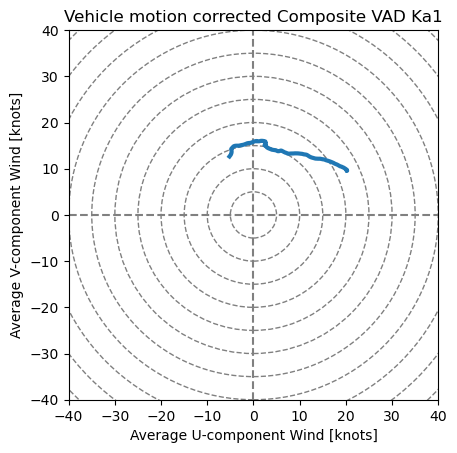

In [14]:
from matplotlib import rcParams, rcParamsDefault

rcParams.update(rcParamsDefault)
fig = plt.figure()
hodo = metpy.plots.Hodograph(component_range=40.)
hodo.add_grid(increment=5)

hodo.plot(avg_vadu,avg_vadv)

plt.xlabel('Average U-component Wind [knots]')
plt.ylabel('Average V-component Wind [knots]')
plt.title('Vehicle motion corrected Composite VAD Ka1')
plt.show()

# KA2

In [15]:
ka2_vad_files = sorted(glob.glob('/Users/juliabman/Desktop/vads_radar_objects/ka2/05232022/dealiased_terminal_corrected_*.nc'))

/Users/juliabman/Desktop/vads_radar_objects/ka2/05232022/dealiased_terminal_corrected_20220523225057.nc
velocity [kts] 0.000425531914893617 +- 1.7021276595744686e-05
bearing 0.35000000000000014 +- 2.803159970669422e-32
latitude 33.87311200000001 +- 2.0411987981976804e-28
longitude -102.76034531914891 +- 5.422100178523569e-13


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)


max height 6005.0  meters
min height 0.0  meters
u velocity [-13.599761009216309 -13.901366233825684 -14.126649856567383
 -14.309885025024414 -14.730575561523438 -14.859606742858887
 -15.117070198059082 -15.292830467224121 -15.390154838562012
 -15.436347007751465]
v velocity [13.359186172485352 13.272828102111816 13.262842178344727
 13.300410270690918 13.392606735229492 13.507089614868164
 13.634385108947754 13.817191123962402 14.053738594055176
 14.275842666625977]
Downloaded KLBB20220523_225011_V06
1 out of 1 files downloaded...0 errors
Downloaded KLBB20220523_225508_V06
1 out of 1 files downloaded...0 errors
['KLBB20220523_225011_V06', 'KLBB20220523_225508_V06']
[<pyart.core.radar.Radar object at 0x2f46e8340>, <pyart.core.radar.Radar object at 0x2ada035b0>]


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/shapely/constructive.py:181: RuntimeWarning: invalid value encountered in buffer
  return lib.buffer(
/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/shapely/predicates.py:798: RuntimeWarning: invalid value encountered in intersects
  return lib.intersects(a, b, **kwargs)
/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/shapely/constructive.py:181: RuntimeWarning: invalid value encountered in buffer
  return lib.buffer(
/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/shapely/predicates.py:798: RuntimeWarning: invalid value encountered in intersects
  return lib.intersects(a, b, **kwargs)


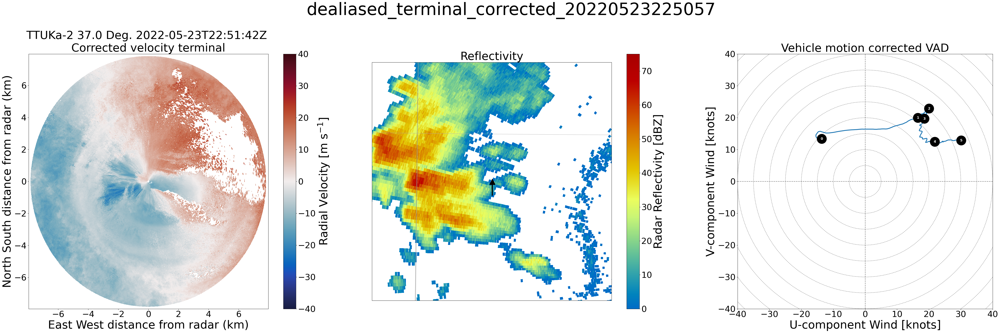

/Users/juliabman/Desktop/vads_radar_objects/ka2/05232022/dealiased_terminal_corrected_20220523225128.nc
velocity [kts] 0.0 +- 0.0
bearing 18.63773234200744 +- 165.67050844219222
latitude 33.87308766171003 +- 2.744551791487719e-10
longitude -102.73445073420072 +- 0.00033219406913399227


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)


max height 6008.0  meters
min height 0.0  meters
u velocity [-2.8419241905212402 -2.416510820388794 -1.980450987815857
 -1.6512619256973267 -0.9628416299819946 -0.7905099987983704
 -0.35769879817962646 0.012633433565497398 0.31971505284309387
 0.47212961316108704]
v velocity [15.737035751342773 15.970433235168457 16.05083465576172
 16.057235717773438 16.207014083862305 16.129159927368164
 16.090709686279297 15.801566123962402 15.47197151184082
 15.161174774169922]
Downloaded KLBB20220523_225011_V06
1 out of 1 files downloaded...0 errors
Downloaded KLBB20220523_225508_V06
1 out of 1 files downloaded...0 errors
['KLBB20220523_225011_V06', 'KLBB20220523_225508_V06']
[<pyart.core.radar.Radar object at 0x2f104af40>, <pyart.core.radar.Radar object at 0x2ff4a1070>]


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/shapely/constructive.py:181: RuntimeWarning: invalid value encountered in buffer
  return lib.buffer(
/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/shapely/predicates.py:798: RuntimeWarning: invalid value encountered in intersects
  return lib.intersects(a, b, **kwargs)
/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/shapely/constructive.py:181: RuntimeWarning: invalid value encountered in buffer
  return lib.buffer(
/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/shapely/predicates.py:798: RuntimeWarning: invalid value encountered in intersects
  return lib.intersects(a, b, **kwargs)


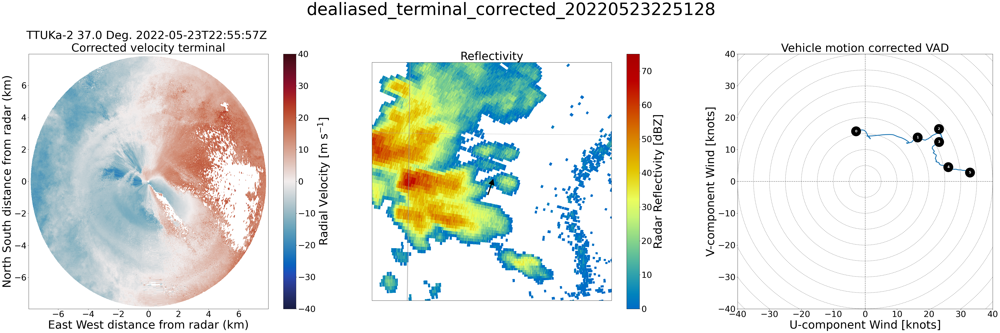

/Users/juliabman/Desktop/vads_radar_objects/ka2/05232022/dealiased_terminal_corrected_20220523225158.nc
velocity [kts] 0.0 +- 0.0
bearing 0.35000000000000003 +- 3.1129316652136544e-33
latitude 33.873111474747475 +- 7.825190698421448e-13
longitude -102.76034668686869 +- 6.866625403380882e-13


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)


max height 6005.0  meters
min height 0.0  meters
u velocity [23.207902908325195 24.53264617919922 25.505420684814453
 26.211572647094727 27.921905517578125 28.247623443603516
 29.254959106445312 29.71393394470215 29.809499740600586 29.73337173461914]
v velocity [12.48119068145752 12.9481840133667 13.280502319335938 13.542381286621094
 14.10110855102539 14.15435791015625 14.46475887298584 14.604724884033203
 14.661845207214355 14.691018104553223]
Downloaded KLBB20220523_225011_V06
1 out of 1 files downloaded...0 errors
Downloaded KLBB20220523_225508_V06
1 out of 1 files downloaded...0 errors
['KLBB20220523_225011_V06', 'KLBB20220523_225508_V06']
[<pyart.core.radar.Radar object at 0x2f44f1310>, <pyart.core.radar.Radar object at 0x2f5258310>]


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/shapely/constructive.py:181: RuntimeWarning: invalid value encountered in buffer
  return lib.buffer(
/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/shapely/predicates.py:798: RuntimeWarning: invalid value encountered in intersects
  return lib.intersects(a, b, **kwargs)
/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/shapely/constructive.py:181: RuntimeWarning: invalid value encountered in buffer
  return lib.buffer(
/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/shapely/predicates.py:798: RuntimeWarning: invalid value encountered in intersects
  return lib.intersects(a, b, **kwargs)


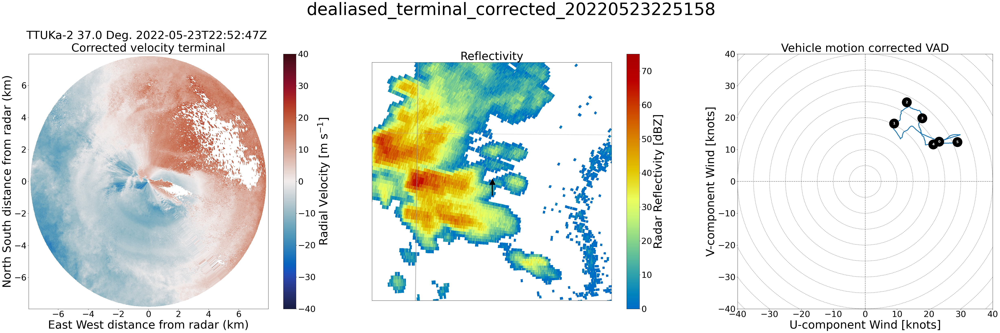

/Users/juliabman/Desktop/vads_radar_objects/ka2/05232022/dealiased_terminal_corrected_20220523225228.nc
velocity [kts] 18.17490390987409 +- 565.6720473391229
bearing 64.00579191517562 +- 3546.987310758145
latitude 33.877297233267065 +- 0.0003899347925037457
longitude -102.67730228495694 +- 0.004448745619848451


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)


max height 6005.0  meters
min height 0.0  meters
u velocity [26.055328369140625 27.58729362487793 28.659156799316406 29.40241050720215
 31.18592071533203 31.448532104492188 32.45815658569336 32.81196594238281
 32.83676528930664 32.63343811035156]
v velocity [2.2253589630126953 2.057373046875 1.9343230724334717 1.8844578266143799
 1.7287201881408691 1.7254233360290527 1.6493732929229736
 1.6314796209335327 1.6937148571014404 1.8044180870056152]
Downloaded KLBB20220523_225011_V06
1 out of 1 files downloaded...0 errors
Downloaded KLBB20220523_225508_V06
1 out of 1 files downloaded...0 errors
['KLBB20220523_225011_V06', 'KLBB20220523_225508_V06']
[<pyart.core.radar.Radar object at 0x2f7b79700>, <pyart.core.radar.Radar object at 0x2f7b7feb0>]


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/shapely/constructive.py:181: RuntimeWarning: invalid value encountered in buffer
  return lib.buffer(
/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/shapely/predicates.py:798: RuntimeWarning: invalid value encountered in intersects
  return lib.intersects(a, b, **kwargs)
/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/shapely/constructive.py:181: RuntimeWarning: invalid value encountered in buffer
  return lib.buffer(
/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/shapely/predicates.py:798: RuntimeWarning: invalid value encountered in intersects
  return lib.intersects(a, b, **kwargs)


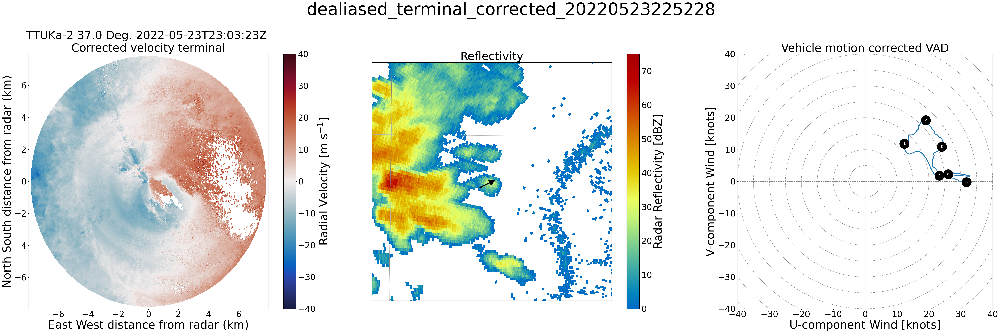

/Users/juliabman/Desktop/vads_radar_objects/ka2/05232022/dealiased_terminal_corrected_20220523225258.nc
velocity [kts] 0.0 +- 0.0
bearing 0.35 +- 0.0
latitude 33.87311057777777 +- 8.40404042131838e-13
longitude -102.76034724444443 +- 1.8888888793509176e-13


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)


max height 6005.0  meters
min height 0.0  meters
u velocity [22.000694274902344 23.258499145507812 23.987926483154297
 24.412431716918945 25.769466400146484 25.729541778564453
 26.04340171813965 25.566280364990234 24.71067237854004 23.698259353637695]
v velocity [12.950620651245117 13.484650611877441 13.896475791931152
 14.251486778259277 14.93776798248291 15.107571601867676
 15.585082054138184 15.843426704406738 16.01838493347168 16.09358787536621]
Downloaded KLBB20220523_225508_V06
1 out of 1 files downloaded...0 errors
Downloaded KLBB20220523_230007_V06
1 out of 1 files downloaded...0 errors
['KLBB20220523_225508_V06', 'KLBB20220523_230007_V06']
[<pyart.core.radar.Radar object at 0x17eb69220>, <pyart.core.radar.Radar object at 0x17a3deee0>]


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/shapely/constructive.py:181: RuntimeWarning: invalid value encountered in buffer
  return lib.buffer(
/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/shapely/predicates.py:798: RuntimeWarning: invalid value encountered in intersects
  return lib.intersects(a, b, **kwargs)
/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/shapely/constructive.py:181: RuntimeWarning: invalid value encountered in buffer
  return lib.buffer(
/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/shapely/predicates.py:798: RuntimeWarning: invalid value encountered in intersects
  return lib.intersects(a, b, **kwargs)


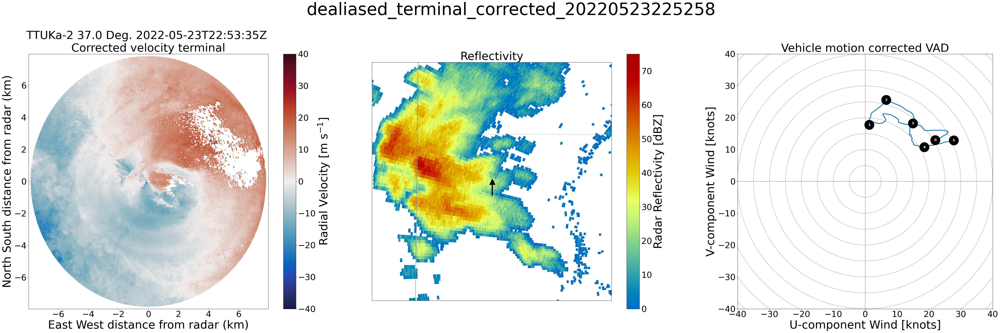

In [57]:
SMALL_SIZE = 30
MEDIUM_SIZE = 40
BIGGER_SIZE = 60

plt.rc('font', size=SMALL_SIZE)          # controls default text sizes
plt.rc('axes', titlesize=MEDIUM_SIZE)     # fontsize of the axes title
plt.rc('axes', labelsize=MEDIUM_SIZE)    # fontsize of the x and y labels
plt.rc('xtick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('ytick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('legend', fontsize=SMALL_SIZE)    # legend fontsize
plt.rc('figure', titlesize=BIGGER_SIZE)  # fontsize of the figure title

#vad_files = test
#vadu_list_ka2 = []
#vadv_list_ka2 = []

#119 east
#170 south
#186 west
#191 north
for thefile in ka2_vad_files[-25:-20]:
    print(thefile)
    radar = pyart.io.read(thefile)
    if np.logical_and(radar.scan_type == 'ppi', radar.fixed_angle['data'][0] > 10):
        
        radar = radar.extract_sweeps([0])
        #radar = dealias_Ka(radar)
        
        df = pd.read_csv('/Users/juliabman/Desktop/research2024/GPS_Ka2_20220523.txt', dtype=str)
        
        radar, velmean, velvar, bearmean, bearvar, latmean, latvar, lonmean, lonvar = vehicle_correction_vad(radar,df)
        radar = pyart.io.read(thefile)

        try:
            VAD = pyart.retrieve.vad_browning(radar, 'corrected_velocity_terminal', z_want=np.arange(50,5001,10),gatefilter=None)
        except:
            print('not enough data')
            continue
        vadu = VAD.u_wind*1.94384 # meters to knots
        vadv = VAD.v_wind*1.94384
        print(f'u velocity {vadu[:10]}')
        print(f'v velocity {vadv[:10]}')
        
        fig = plt.figure(figsize=(51, 17),facecolor='white')
        display = pyart.graph.RadarDisplay(radar)
        
        ax1 = plt.subplot2grid((1,3),(0,0))
        display.plot_ppi('corrected_velocity_terminal', 0, cmap='pyart_balance', ax=ax1, vmin=-40., vmax=40.,
                             colorbar_label=r'Radial Velocity [m s$^{-1}$]') #title='Motion Corrected Radial Velocity')
        
        ax3 = plt.subplot2grid((1,3),(0,2))
        
        hodo = metpy.plots.Hodograph(ax3,component_range=40.)
        hodo.add_grid(increment=5)
        
        hodo.plot(vadu,vadv)

        ax3.set_xlabel('U-component Wind [knots]')
        ax3.set_ylabel('V-component Wind [knots]')
        ax3.set_title('Vehicle motion corrected VAD')

        # base = pyplot.gca().transData
        # rot = transforms.Affine2D().rotate_deg(90)
        
        for i,z in enumerate([0,95,195,295,395,495]):
            try:
                if np.isnan(vadu[z]):
                    pass
                else:
                    circle = plt.Circle((vadu[z], vadv[z]), radius=1.5,color='k',zorder=30)
                    ax3.add_patch(circle)
                    label = ax3.annotate(i, xy=(vadu[z], vadv[z]), fontsize=12, ha="center",va='center',color='white',zorder=30,weight="bold")
            except: pass
        
        
        r=35
        radar_namelist, radar_list = get_radar_from_aws_sam('KLBB', datetime.strptime(thefile.split('/')[-1].split('.')[0][29:],'%Y%m%d%H%M%S'), datetime.strptime(thefile.split('/')[-1].split('.')[0][29:],'%Y%m%d%H%M%S')+timedelta(minutes=5))
        print(radar_namelist)
        print(radar_list)
        #scantime88d = datetime.strptime(str(radar_namelist)[40:57], '%Y%m%d_%H%M%S') #SAM DELETED THAT
        swp_id = 0
        radar88d = radar_list[0].extract_sweeps([0])
        scantime88d = pyart.util.datetime_from_radar(radar88d)
        # SAM ADDED THAT^^^
        time_text = ' ' + str(radar88d.time['units'][-9:1])
        title ='KLBB PPI ' +scantime88d.strftime("%m/%d/%y %H:%M")+ ' UTC'
        display = pyart.graph.RadarMapDisplay(radar88d)
        ax2 = plt.subplot2grid((1,3),(0,1),projection=display.grid_projection)
        display.plot_ppi_map('reflectivity', swp_id, cmap='pyart_HomeyerRainbow', ax=ax2, vmin=0., vmax=75., 
                             colorbar_label='Radar Reflectivity [dBZ]', title='Reflectivity',
                             min_lon=getLocation(latmean, lonmean, 270, r)[1],
                             max_lon=getLocation(latmean, lonmean, 90, r)[1],
                             min_lat=getLocation(latmean, lonmean, 180, r)[0],
                             max_lat=getLocation(latmean, lonmean, 0, r)[0])
        
        m = matplotlib.markers.MarkerStyle(marker='^')
        m._transform = m.get_transform().rotate_deg(-bearmean)
        ax2.plot(lonmean,latmean,color='k',marker=m,ms=20,transform=ccrs.PlateCarree())
        m = matplotlib.markers.MarkerStyle(marker=3)
        m._transform = m.get_transform().rotate_deg(-bearmean)
        ax2.plot(lonmean,latmean,color='k',marker=m,ms=50,transform=ccrs.PlateCarree(),markeredgewidth=4)


        fname=thefile.split('/')[-1].split('.')[0][:]
        plt.suptitle(fname)#+' '+str(np.around(dfscan['Bearing[degrees]'].astype(float).var(),decimals=2))+' '+str(np.around(dfscan['Velocity[knots]'].astype(float).var(),decimals=2)))
        plt.tight_layout()
        # plt.savefig(f"/Users/juliabman/Desktop/alex_morton_hodos/{fname}.png")
        # plt.close()
        # fig.clf()
        # gc.collect()
        plt.show()
        #vadu_list_ka2.append(vadu)
        #vadv_list_ka2.append(vadv)

In [16]:
SMALL_SIZE = 30
MEDIUM_SIZE = 40
BIGGER_SIZE = 60

plt.rc('font', size=SMALL_SIZE)          # controls default text sizes
plt.rc('axes', titlesize=MEDIUM_SIZE)     # fontsize of the axes title
plt.rc('axes', labelsize=MEDIUM_SIZE)    # fontsize of the x and y labels
plt.rc('xtick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('ytick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('legend', fontsize=SMALL_SIZE)    # legend fontsize
plt.rc('figure', titlesize=BIGGER_SIZE)  # fontsize of the figure title

#vad_files = test
vadu_list_ka2 = []
vadv_list_ka2 = []

#119 east
#170 south
#186 west
#191 north
for thefile in ka2_vad_files:
    print(thefile)
    radar = pyart.io.read(thefile)
    if np.logical_and(radar.scan_type == 'ppi', radar.fixed_angle['data'][0] > 10):
        
        radar = radar.extract_sweeps([0])
        #radar = dealias_Ka(radar)
        
        #df = pd.read_csv('/Users/juliabman/Desktop/research2024/GPS_Ka2_20220523.txt', dtype=str)
        
        #radar, velmean, velvar, bearmean, bearvar, latmean, latvar, lonmean, lonvar = vehicle_correction_vad(radar,df)
        radar = pyart.io.read(thefile)

        try:
            VAD = pyart.retrieve.vad_browning(radar, 'corrected_velocity_terminal', z_want=np.arange(50,5001,10),gatefilter=None)
        except:
            print('not enough data')
            continue
        vadu = VAD.u_wind*1.94384 # meters to knots
        vadv = VAD.v_wind*1.94384
        print(f'u velocity {vadu[:10]}')
        print(f'v velocity {vadv[:10]}')
        
        # fig = plt.figure(figsize=(51, 17),facecolor='white')
        # display = pyart.graph.RadarDisplay(radar)
        
        # ax1 = plt.subplot2grid((1,3),(0,0))
        # display.plot_ppi('corrected_velocity_terminal', 0, cmap='pyart_balance', ax=ax1, vmin=-40., vmax=40.,
        #                      colorbar_label=r'Radial Velocity [m s$^{-1}$]') #title='Motion Corrected Radial Velocity')
        
        # ax3 = plt.subplot2grid((1,3),(0,2))
        
        # hodo = metpy.plots.Hodograph(ax3,component_range=40.)
        # hodo.add_grid(increment=5)
        
        # hodo.plot(vadu,vadv)

        # ax3.set_xlabel('U-component Wind [knots]')
        # ax3.set_ylabel('V-component Wind [knots]')
        # ax3.set_title('Vehicle motion corrected VAD')

        # # base = pyplot.gca().transData
        # # rot = transforms.Affine2D().rotate_deg(90)
        
        # for i,z in enumerate([0,95,195,295,395,495]):
        #     try:
        #         if np.isnan(vadu[z]):
        #             pass
        #         else:
        #             circle = plt.Circle((vadu[z], vadv[z]), radius=1.5,color='k',zorder=30)
        #             ax3.add_patch(circle)
        #             label = ax3.annotate(i, xy=(vadu[z], vadv[z]), fontsize=12, ha="center",va='center',color='white',zorder=30,weight="bold")
        #     except: pass
        
        
        # r=35
        # radar_namelist, radar_list = get_radar_from_aws_sam('KLBB', datetime.strptime(thefile.split('/')[-1].split('.')[0][29:],'%Y%m%d%H%M%S'), datetime.strptime(thefile.split('/')[-1].split('.')[0][29:],'%Y%m%d%H%M%S')+timedelta(minutes=5))
        # print(radar_namelist)
        # print(radar_list)
        # #scantime88d = datetime.strptime(str(radar_namelist)[40:57], '%Y%m%d_%H%M%S') #SAM DELETED THAT
        # swp_id = 0
        # radar88d = radar_list[0].extract_sweeps([0])
        # scantime88d = pyart.util.datetime_from_radar(radar88d)
        # # SAM ADDED THAT^^^
        # time_text = ' ' + str(radar88d.time['units'][-9:1])
        # title ='KLBB PPI ' +scantime88d.strftime("%m/%d/%y %H:%M")+ ' UTC'
        # display = pyart.graph.RadarMapDisplay(radar88d)
        # ax2 = plt.subplot2grid((1,3),(0,1),projection=display.grid_projection)
        # display.plot_ppi_map('reflectivity', swp_id, cmap='pyart_HomeyerRainbow', ax=ax2, vmin=0., vmax=75., 
        #                      colorbar_label='Radar Reflectivity [dBZ]', title='Reflectivity',
        #                      min_lon=getLocation(latmean, lonmean, 270, r)[1],
        #                      max_lon=getLocation(latmean, lonmean, 90, r)[1],
        #                      min_lat=getLocation(latmean, lonmean, 180, r)[0],
        #                      max_lat=getLocation(latmean, lonmean, 0, r)[0])
        
        # m = matplotlib.markers.MarkerStyle(marker='^')
        # m._transform = m.get_transform().rotate_deg(-bearmean)
        # ax2.plot(lonmean,latmean,color='k',marker=m,ms=20,transform=ccrs.PlateCarree())
        # m = matplotlib.markers.MarkerStyle(marker=3)
        # m._transform = m.get_transform().rotate_deg(-bearmean)
        # ax2.plot(lonmean,latmean,color='k',marker=m,ms=50,transform=ccrs.PlateCarree(),markeredgewidth=4)


        # fname=thefile.split('/')[-1].split('.')[0][:]
        # plt.suptitle(fname)#+' '+str(np.around(dfscan['Bearing[degrees]'].astype(float).var(),decimals=2))+' '+str(np.around(dfscan['Velocity[knots]'].astype(float).var(),decimals=2)))
        # plt.tight_layout()
        # plt.savefig(f"/Users/juliabman/Desktop/alex_morton_hodos/{fname}.png")
        # plt.close()
        # fig.clf()
        # gc.collect()
        #plt.show()
        vadu_list_ka2.append(vadu)
        vadv_list_ka2.append(vadv)

/Users/juliabman/Desktop/vads_radar_objects/ka2/05232022/dealiased_terminal_corrected_20220523221144.nc


/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:336: RuntimeWarning: Mean of empty slice
  mean_velocity_per_gate = np.nanmean(velocities, axis=0).reshape(1, -1)
/Users/juliabman/miniforge3/envs/Research/lib/python3.9/site-packages/pyart/retrieve/vad.py:415: UserWarning: Warning: converting a masked element to nan.
  y_new[i] = np.average(y_in_window, weights=weights)


max height 6019.0  meters
min height 0.0  meters
u velocity [0.6164675354957581 0.7704261541366577 1.0645111799240112
 1.4471628665924072 1.7824212312698364 1.7824212312698364
 2.188506603240967 2.277858018875122 2.8006372451782227 3.3604214191436768]
v velocity [-0.02120925858616829 0.6408985257148743 0.47202903032302856
 -0.4645058214664459 -0.7007525563240051 -0.7007525563240051
 -0.9224530458450317 -0.9078027009963989 -2.675313949584961
 -5.147181510925293]
/Users/juliabman/Desktop/vads_radar_objects/ka2/05232022/dealiased_terminal_corrected_20220523221214.nc
max height 6005.0  meters
min height 0.0  meters
u velocity [0.6072404384613037 -1.6752047538757324 -6.15039587020874
 -6.15039587020874 -7.735314846038818 -7.735314846038818
 -10.544002532958984 -16.286848068237305 -24.05116081237793 nan]
v velocity [0.5773091316223145 -0.20150411128997803 -0.09287777543067932
 -0.09287777543067932 -0.08745738118886948 -0.08745738118886948
 -0.24771693348884583 -1.098161220550537 0.3416215181

In [17]:
np.shape(vadu_list_ka2)

(93, 496)

In [18]:
vadu_ka2_array = np.array(vadu_list_ka2)
vadv_ka2_array = np.array(vadv_list_ka2)

vadu_df_ka2 = pd.DataFrame(vadu_ka2_array)
vadv_df_ka2 = pd.DataFrame(vadv_ka2_array)

In [19]:
vadu_df_nonan = vadu_df_ka2.dropna()
vadv_df_nonan = vadv_df_ka2.dropna()

In [20]:
avg_vadu_ka2 = vadu_df_nonan.mean(axis=0)
avg_vadv_ka2 = vadv_df_nonan.mean(axis=0)

<Figure size 640x480 with 0 Axes>

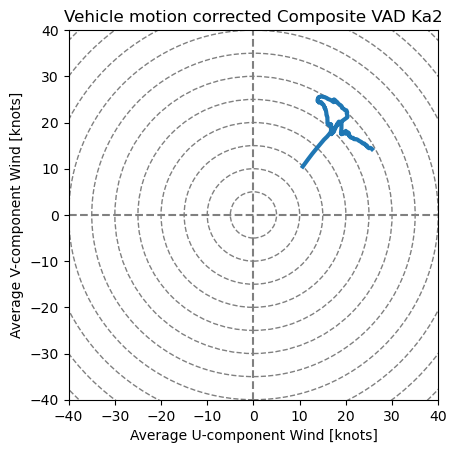

In [21]:
from matplotlib import rcParams, rcParamsDefault

rcParams.update(rcParamsDefault)
fig = plt.figure()
hodo = metpy.plots.Hodograph(component_range=40.)
hodo.add_grid(increment=5)

hodo.plot(avg_vadu_ka2,avg_vadv_ka2)

plt.xlabel('Average U-component Wind [knots]')
plt.ylabel('Average V-component Wind [knots]')
plt.title('Vehicle motion corrected Composite VAD Ka2')
plt.show()

In [52]:
SMALL_SIZE = 30
MEDIUM_SIZE = 40
BIGGER_SIZE = 60

plt.rc('font', size=SMALL_SIZE)          # controls default text sizes
plt.rc('axes', titlesize=MEDIUM_SIZE)     # fontsize of the axes title
plt.rc('axes', labelsize=MEDIUM_SIZE)    # fontsize of the x and y labels
plt.rc('xtick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('ytick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('legend', fontsize=SMALL_SIZE)    # legend fontsize
plt.rc('figure', titlesize=BIGGER_SIZE)  # fontsize of the figure title

#vad_files = test
#vadu_list_ka2 = []
#vadv_list_ka2 = []
maybe_vads = sorted(glob.glob('/Users/juliabman/Desktop/ka2_ppis_rhis_called_vads/05232022/*.nc'))
#119 east
#170 south
#186 west
#191 north
for thefile in maybe_vads[0:2]:
    print(thefile)
    radar = pyart.io.read(thefile)
    if np.logical_and(radar.scan_type == 'ppi', radar.fixed_angle['data'][0] > 10):
        
        radar = radar.extract_sweeps([0])
        #radar = dealias_Ka(radar)
        
        df = pd.read_csv('/Users/juliabman/Desktop/research2024/GPS_Ka2_20220523.txt', dtype=str)
        
        radar, velmean, velvar, bearmean, bearvar, latmean, latvar, lonmean, lonvar = vehicle_correction_vad(radar,df)
        radar = pyart.io.read(thefile)

        try:
            VAD = pyart.retrieve.vad_browning(radar, 'velocity', z_want=np.arange(50,5001,10),gatefilter=None)
        except:
            print('not enough data')
            continue
        vadu = VAD.u_wind*1.94384 # meters to knots
        vadv = VAD.v_wind*1.94384
        print(f'u velocity {vadu[:10]}')
        print(f'v velocity {vadv[:10]}')
        
        fig = plt.figure(figsize=(51, 17),facecolor='white')
        display = pyart.graph.RadarDisplay(radar)
        
        ax1 = plt.subplot2grid((1,3),(0,0))
        display.plot_ppi('velocity', 0, cmap='pyart_balance', ax=ax1, vmin=-40., vmax=40.,
                             colorbar_label=r'Radial Velocity [m s$^{-1}$]') #title='Motion Corrected Radial Velocity')
        
        ax3 = plt.subplot2grid((1,3),(0,2))
        
        hodo = metpy.plots.Hodograph(ax3,component_range=40.)
        hodo.add_grid(increment=5)
        
        hodo.plot(vadu,vadv)

        ax3.set_xlabel('U-component Wind [knots]')
        ax3.set_ylabel('V-component Wind [knots]')
        ax3.set_title('Vehicle motion corrected VAD')

        # base = pyplot.gca().transData
        # rot = transforms.Affine2D().rotate_deg(90)
        
        for i,z in enumerate([0,95,195,295,395,495]):
            try:
                if np.isnan(vadu[z]):
                    pass
                else:
                    circle = plt.Circle((vadu[z], vadv[z]), radius=1.5,color='k',zorder=30)
                    ax3.add_patch(circle)
                    label = ax3.annotate(i, xy=(vadu[z], vadv[z]), fontsize=12, ha="center",va='center',color='white',zorder=30,weight="bold")
            except: pass
        
        
        r=35
        radar_namelist, radar_list = get_radar_from_aws_sam('KLBB', datetime.strptime(thefile.split('/')[-1].split('.')[0][29:],'%Y%m%d%H%M%S'), datetime.strptime(thefile.split('/')[-1].split('.')[0][29:],'%Y%m%d%H%M%S')+timedelta(minutes=5))
        print(radar_namelist)
        print(radar_list)
        #scantime88d = datetime.strptime(str(radar_namelist)[40:57], '%Y%m%d_%H%M%S') #SAM DELETED THAT
        swp_id = 0
        radar88d = radar_list[0].extract_sweeps([0])
        scantime88d = pyart.util.datetime_from_radar(radar88d)
        # SAM ADDED THAT^^^
        time_text = ' ' + str(radar88d.time['units'][-9:1])
        title ='KLBB PPI ' +scantime88d.strftime("%m/%d/%y %H:%M")+ ' UTC'
        display = pyart.graph.RadarMapDisplay(radar88d)
        ax2 = plt.subplot2grid((1,3),(0,1),projection=display.grid_projection)
        display.plot_ppi_map('reflectivity', swp_id, cmap='pyart_HomeyerRainbow', ax=ax2, vmin=0., vmax=75., 
                             colorbar_label='Radar Reflectivity [dBZ]', title='Reflectivity',
                             min_lon=getLocation(latmean, lonmean, 270, r)[1],
                             max_lon=getLocation(latmean, lonmean, 90, r)[1],
                             min_lat=getLocation(latmean, lonmean, 180, r)[0],
                             max_lat=getLocation(latmean, lonmean, 0, r)[0])
        
        m = matplotlib.markers.MarkerStyle(marker='^')
        m._transform = m.get_transform().rotate_deg(-bearmean)
        ax2.plot(lonmean,latmean,color='k',marker=m,ms=20,transform=ccrs.PlateCarree())
        m = matplotlib.markers.MarkerStyle(marker=3)
        m._transform = m.get_transform().rotate_deg(-bearmean)
        ax2.plot(lonmean,latmean,color='k',marker=m,ms=50,transform=ccrs.PlateCarree(),markeredgewidth=4)


        fname=thefile.split('/')[-1].split('.')[0][:]
        plt.suptitle(fname)#+' '+str(np.around(dfscan['Bearing[degrees]'].astype(float).var(),decimals=2))+' '+str(np.around(dfscan['Velocity[knots]'].astype(float).var(),decimals=2)))
        plt.tight_layout()
        # plt.savefig(f"/Users/juliabman/Desktop/alex_morton_hodos/{fname}.png")
        # plt.close()
        # fig.clf()
        # gc.collect()
        plt.show()
        #vadu_list_ka2.append(vadu)
        #vadv_list_ka2.append(vadv)

/Users/juliabman/Desktop/ka2_ppis_rhis_called_vads/05232022/20220523232135.nc
/Users/juliabman/Desktop/ka2_ppis_rhis_called_vads/05232022/20220523232431.nc


In [43]:
test = maybe_vads[-1]
read = pyart.io.read(test)

<Figure size 200x200 with 0 Axes>

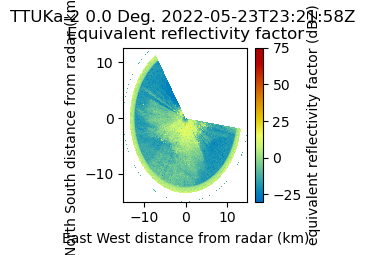

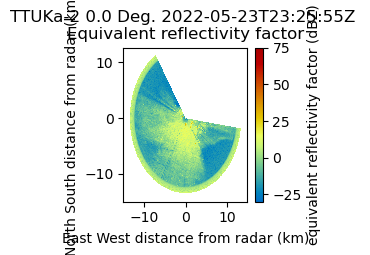

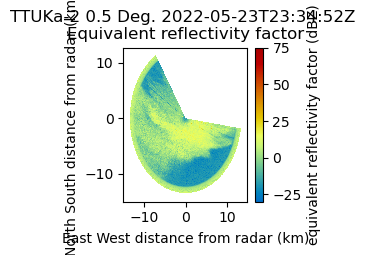

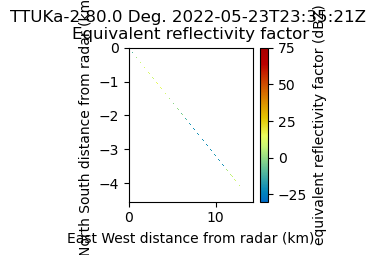

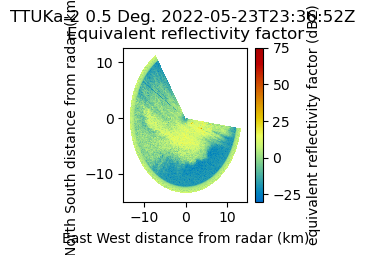

...

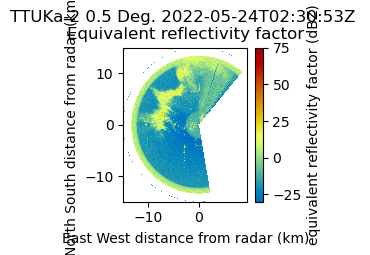

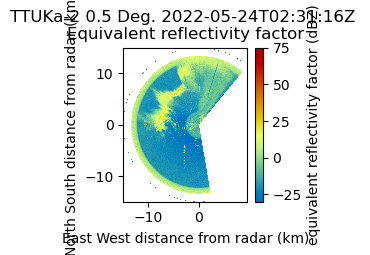

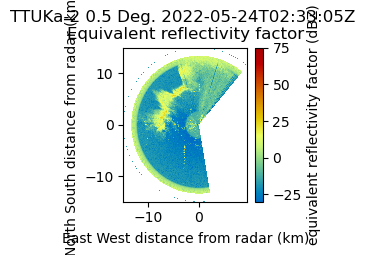

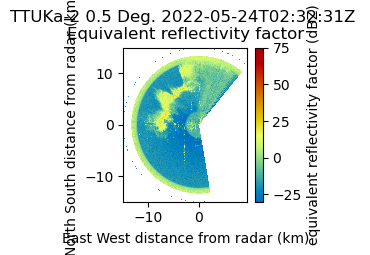

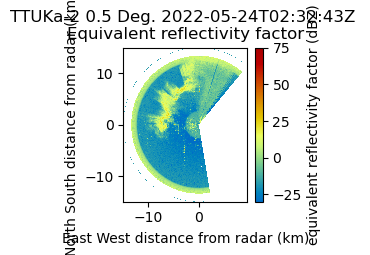

In [64]:
for vad in maybe_vads:
    rcParams.update(rcParamsDefault)
    fig = plt.figure(figsize= (2,2))
    read = pyart.io.read(vad)
    test_plot = pyart.graph.RadarMapDisplay(read)
    test_plot.plot_ppi('reflectivity')
    plt.show()

In [45]:
read.fields

{'total_power': {'_FillValue': -9999.0,
  'long_name': 'Total power',
  'units': 'dBZ',
  'standard_name': 'equivalent_reflectivity_factor',
  'coordinates': 'elevation azimuth range',
  'data': masked_array(
    data=[[25.5, 26.0, 22.5, ..., --, --, -15.0],
          [25.5, 26.0, 22.5, ..., --, --, -15.0],
          [25.5, 26.0, 22.5, ..., --, --, -15.0],
          ...,
          [25.5, 26.0, 22.5, ..., --, --, -15.0],
          [25.5, 26.0, 22.5, ..., --, --, -15.0],
          [--, --, --, ..., --, --, --]],
    mask=[[False, False, False, ...,  True,  True, False],
          [False, False, False, ...,  True,  True, False],
          [False, False, False, ...,  True,  True, False],
          ...,
          [False, False, False, ...,  True,  True, False],
          [False, False, False, ...,  True,  True, False],
          [ True,  True,  True, ...,  True,  True,  True]],
    fill_value=-9999.0,
    dtype=float32)},
 'reflectivity': {'_FillValue': -9999.0,
  'long_name': 'Reflectivity